In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 14

import seaborn as sns
palette = sns.color_palette('Paired', 10)

# Set random seed 
RSEED = 100

In [2]:
# LOAD DATA TO BE MANIPULATED

data = pd.read_csv("../00_Data_Sets/100_k_dataset_2015.csv");
data_manipulated = pd.read_csv("../00_Data_Sets/100_k_dataset_2015.csv");

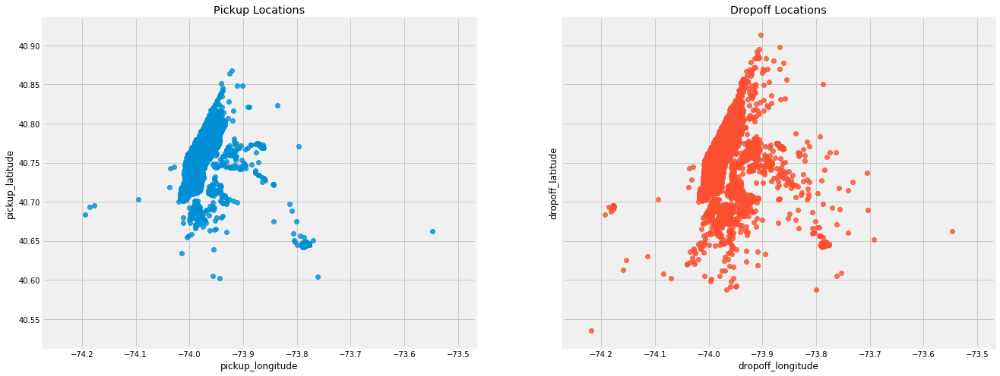

In [3]:
# Print Locations

fig, axes = plt.subplots(1, 2, figsize = (20, 8), sharex=True, sharey=True)
axes = axes.flatten()

# Plot Longitude (x) and Latitude (y)
sns.regplot('pickup_longitude', 'pickup_latitude', fit_reg = False, 
            data = data.sample(10000, random_state = RSEED), ax = axes[0]);
sns.regplot('dropoff_longitude', 'dropoff_latitude', fit_reg = False, 
            data = data.sample(10000, random_state = RSEED), ax = axes[1]);
axes[0].set_title('Pickup Locations')
axes[1].set_title('Dropoff Locations');

In [5]:
from random import random

def make_location_distance_outlier(variable):
    random_float_is_outlier = random()
    random_float_is_negative = random()    
    random_float_outlier = random() * 2
    
    if random_float_is_outlier > 0.999:
        if random_float_is_negative > 0.5:
            return random_float_outlier * (-1)
        return random_float_outlier
    
    return 0;

In [23]:
data_manipulated.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,manhattan,euclidean,haversine
count,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000
mean,12.898841,-73.974742,40.749311,-73.972721,40.752247,1.526672,0.021339,0.023760,0.045099,0.034898,3.394644
std,10.835837,0.041779,0.060156,0.044992,0.044873,1.075492,0.023589,0.035833,0.052817,0.040527,3.764279
min,2.500000,-74.896887,37.902044,-74.291611,40.109385,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,-73.992081,40.736668,-73.991364,40.735741,1.000000,0.006870,0.006187,0.016201,0.012678,1.242527
50%,9.500000,-73.981934,40.753708,-73.979996,40.754356,1.000000,0.013760,0.012672,0.027721,0.021516,2.120602
75%,14.500000,-73.967613,40.768211,-73.963264,40.769405,2.000000,0.026730,0.024231,0.050611,0.038623,3.907561
max,100.000000,-73.532593,40.970356,-72.900878,42.584239,5.000000,0.281437,0.377335,0.495525,0.380997,34.818911


In [49]:
from random import random 

data_manipulated = data.head(20).copy()

data_manipulated['pickup_longitude'][3] = 20
data_manipulated['pickup_longitude']


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


0    -73.955086
1    -73.991493
2    -73.989342
3     20.000000
4    -73.995689
5    -73.988228
6    -73.986130
7    -73.948402
8    -73.984352
9    -73.993706
10   -74.001450
11   -73.993904
12   -74.000046
13   -74.003731
14   -73.973305
15   -73.980606
16   -73.997833
17   -73.987137
18   -73.958107
19   -73.993256
Name: pickup_longitude, dtype: float64

In [4]:
from random import random, uniform, sample

outlier_indices = sample(range(1, data_manipulated.shape[0]), (int(data_manipulated.shape[0] * 0.001)))

def generate_outlier_coordinates():
    pickup_longitude = uniform(-74.2,-74.9)
    pickup_latitude = uniform(37.9,40.4)
    dropoff_longitude = uniform(-72.9,-73.2)
    dropoff_latitude = uniform(40.1,42.6)
    
    return pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude;
    
def update_sample(index, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude):
    data_manipulated['pickup_longitude'][index] = pickup_longitude
    data_manipulated['pickup_latitude'][index] = pickup_latitude
    data_manipulated['dropoff_longitude'][index] = dropoff_longitude
    data_manipulated['dropoff_latitude'][index] = dropoff_latitude

for index in outlier_indices:
    pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude = generate_outlier_coordinates();
    update_sample(index, pickup_longitude, pickup_latitude, dropoff_longitude, dropoff_latitude);


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/usr/local/lib/python3.7/site-packages/ipyk

In [8]:
# CREATE absolute difference column in latitude and longitude
data_manipulated['abs_lat_diff'] = (data_manipulated['dropoff_latitude'] - data_manipulated['pickup_latitude']).abs()
data_manipulated['abs_lon_diff'] = (data_manipulated['dropoff_longitude'] - data_manipulated['pickup_longitude']).abs()

In [9]:
# DEFINE Minovski Distance returning 1) Manhattan Distance (p1) and 2) Euclidean Distance (p2)
def minkowski_distance(x1, x2, y1, y2, p):
    return ((abs(x2 - x1) ** p) + (abs(y2 - y1)) ** p) ** (1 / p)

In [12]:
# Defining Haversine distance - great circle distance, taking into account the spheric surface of the earth

# Radius of the earth in kilometers
R = 6378

def haversine_np(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    
    
    source: https://stackoverflow.com/a/29546836

    """
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to kilometers
    km = R * c
    
    return km

In [10]:
# CREATE MANHATTEN: Calculate relative distances between rides
data_manipulated['manhattan'] = minkowski_distance(data_manipulated['pickup_longitude'], data_manipulated['dropoff_longitude'],
                                       data_manipulated['pickup_latitude'], data_manipulated['dropoff_latitude'], 1)

In [11]:
# CREATE EUCLIDEAN: Calculate relative distances between rides
data_manipulated['euclidean'] = minkowski_distance(data_manipulated['pickup_longitude'], data_manipulated['dropoff_longitude'],
                                       data_manipulated['pickup_latitude'], data_manipulated['dropoff_latitude'], 2)

In [13]:
# CREATING Haversine distance

data_manipulated['haversine'] =  haversine_np(data_manipulated['pickup_longitude'], data_manipulated['pickup_latitude'],
                         data_manipulated['dropoff_longitude'], data_manipulated['dropoff_latitude'])

In [14]:
data.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,manhattan,euclidean,haversine
count,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000
mean,12.898841,-73.974159,40.750822,-73.973617,40.751591,1.526672,0.021339,0.023760,0.045099,0.034898,3.394644
std,10.835837,0.036963,0.027705,0.034712,0.031731,1.075492,0.023589,0.035833,0.052817,0.040527,3.764279
min,2.500000,-74.291595,40.470993,-74.291611,40.535355,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,-73.992050,40.736729,-73.991379,40.735740,1.000000,0.006870,0.006187,0.016201,0.012678,1.242527
50%,9.500000,-73.981918,40.753759,-73.980019,40.754349,1.000000,0.013760,0.012672,0.027721,0.021516,2.120602
75%,14.500000,-73.967588,40.768227,-73.963333,40.769345,2.000000,0.026730,0.024231,0.050611,0.038623,3.907561
max,100.000000,-73.532593,40.970356,-73.532593,41.057537,5.000000,0.281437,0.377335,0.495525,0.380997,34.818911


In [15]:
data_manipulated.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,manhattan,euclidean,haversine
count,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000
mean,12.898841,-73.974704,40.749244,-73.972699,40.752115,1.526672,0.023421,0.025201,0.048623,0.037506,3.663538
std,10.835837,0.041272,0.061300,0.045388,0.042402,1.075492,0.076933,0.058425,0.127703,0.095441,9.785731
min,2.500000,-74.899808,37.912229,-74.291611,40.124905,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,-73.992081,40.736667,-73.991365,40.735725,1.000000,0.006878,0.006195,0.016212,0.012688,1.243390
50%,9.500000,-73.981934,40.753714,-73.979996,40.754356,1.000000,0.013783,0.012688,0.027752,0.021537,2.122738
75%,14.500000,-73.967621,40.768211,-73.963264,40.769398,2.000000,0.026787,0.024292,0.050733,0.038726,3.915190
max,100.000000,-73.532593,40.970356,-72.902353,42.592319,5.000000,4.423534,1.922139,5.934407,4.674440,508.851457


In [21]:
data_manipulated.sort_values(by=['haversine']).tail(100)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,fare-bin,abs_lat_diff,abs_lon_diff,color,manhattan,euclidean,haversine
72051,2015-05-11 20:00:27.0000001,88.58,2015-05-11 20:00:27+00:00,-73.776688,40.645351,-74.154022,40.592651,2,[45+],0.052700,0.377335,"(0.9921568627450981, 0.7490196078431373, 0.435...",0.430035,0.380997,32.418389
631,2015-01-02 14:50:46.0000004,83.33,2015-01-02 14:50:46+00:00,-73.863670,40.769932,-73.622108,41.023895,1,[45+],0.253963,0.241562,"(0.9921568627450981, 0.7490196078431373, 0.435...",0.495525,0.350499,34.818911
39438,2015-03-14 12:33:07.0000002,57.33,2015-03-14 12:33:07+00:00,-74.334203,40.205781,-73.180145,40.374229,2,[45+],0.168449,1.154058,"(0.9921568627450981, 0.7490196078431373, 0.435...",1.322507,1.166287,99.768918
31189,2015-02-27 14:58:49.0000003,12.00,2015-02-27 14:58:49+00:00,-74.256826,40.118766,-73.000392,40.214917,5,"(10.0, 15.0]",0.096152,1.256434,"(0.2, 0.6274509803921569, 0.17254901960784313)",1.352586,1.260108,107.412410
39612,2015-03-14 18:21:36.00000016,10.00,2015-03-14 18:21:36+00:00,-74.419477,40.345636,-73.062683,40.482884,1,"(05.0, 10.0]",0.137248,1.356794,"(0.6980392156862745, 0.8745098039215686, 0.541...",1.494042,1.363718,116.003362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13472,2015-01-26 08:25:18.0000009,9.50,2015-01-26 08:25:18+00:00,-74.350823,38.541405,-73.012141,42.246369,2,"(05.0, 10.0]",3.704963,1.338682,"(0.6980392156862745, 0.8745098039215686, 0.541...",5.043646,3.939394,427.739731
44545,2015-03-23 17:08:54.0000002,35.54,2015-03-23 17:08:54+00:00,-74.463222,38.402312,-73.019151,42.309789,3,"(35.0, 40.0]",3.907477,1.444071,"(0.792156862745098, 0.6980392156862745, 0.8392...",5.351547,4.165779,451.868083
24647,2015-02-15 21:22:33.0000008,7.50,2015-02-15 21:22:33+00:00,-74.500539,38.106162,-73.158383,42.100654,1,"(05.0, 10.0]",3.994491,1.342156,"(0.6980392156862745, 0.8745098039215686, 0.541...",5.336647,4.213946,459.086840
16957,2015-02-02 15:37:58.0000001,7.00,2015-02-02 15:37:58+00:00,-74.401746,38.507185,-72.923950,42.572380,1,"(05.0, 10.0]",4.065195,1.477796,"(0.6980392156862745, 0.8745098039215686, 0.541...",5.542991,4.325470,469.454049


In [37]:
from random import sample

sample(range(1, data_manipulated.size), (int(data_manipulated.size * 0.001)))

AttributeError: 'list' object has no attribute 'info'

In [31]:
data_manipulated.loc['pickup_longitude'] = 20
data_manipulated.head(2)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,fare-bin,abs_lat_diff,abs_lon_diff,color,manhattan,euclidean,haversine
0,2015-01-01 00:04:28.0000001,13.0,2015-01-01 00:04:28+00:00,-73.955086,40.779339,-73.982368,40.742729,1.0,"(10.0, 15.0]",0.036610,0.027283,"(0.2, 0.6274509803921569, 0.17254901960784313)",0.063892,0.045658,4.679701
1,2015-01-01 00:05:59.0000003,10.2,2015-01-01 00:05:59+00:00,-73.991493,40.722698,-73.992554,40.743252,2.0,"(10.0, 15.0]",0.020554,0.001060,"(0.2, 0.6274509803921569, 0.17254901960784313)",0.021614,0.020581,2.289714


In [8]:
# Create random outliers (might be incorrect!)

data_manipulated = data.copy()

data_manipulated['pickup_longitude'] = data_manipulated['pickup_longitude'] + data_manipulated['pickup_longitude'].apply(make_lat_long_outlier)
data_manipulated['pickup_latitude'] = data_manipulated['pickup_latitude'] + data_manipulated['pickup_latitude'].apply(make_lat_long_outlier)
data_manipulated['dropoff_longitude'] = data_manipulated['dropoff_longitude'] + data_manipulated['dropoff_longitude'].apply(make_lat_long_outlier)
data_manipulated['dropoff_latitude'] = data_manipulated['dropoff_latitude'] + data_manipulated['dropoff_latitude'].apply(make_lat_long_outlier)

data_manipulated.describe()

-73.95508575439453
-73.99149322509766
-73.98934173583984
-73.97846221923827
-73.99568939208984
-73.98822784423827
-73.98612976074219
-73.94840240478516
-73.9843521118164
-73.99370574951173
-74.00144958496094
-73.99390411376955
-74.0000457763672
-74.00373077392578
-73.97330474853516
-73.98060607910156
-73.99783325195312
-73.9871368408203
-73.9581069946289
-73.99325561523438
-73.97427368164062
-73.93814849853516
-73.95762634277344
-73.98875427246094
-73.98573303222656
-73.96908569335938
-73.9912567138672
-73.97808837890625
-73.99932861328125
-73.98798370361328
-73.97730255126955
-73.97820281982422
-73.986572265625
-73.98320007324219
-73.98373413085938
-73.9838333129883
-73.99134826660156
-73.97097778320312
-74.00534057617188
-73.9895782470703
-73.96318054199219
-73.91951751708984
-73.94698333740234
-73.95657348632812
-73.95834350585938
-73.97919464111328
-73.98605346679686
-74.0001449584961
-73.9598617553711
-73.98224639892578
-73.98133087158203
-73.97441864013672
-73.96188354492188
-73.

-73.96741485595702
-73.95769500732422
-74.00662231445312
-73.9542007446289
-74.00299072265625
-73.99618530273438
-74.0008316040039
-73.9733123779297
-73.86273193359375
-73.99562072753906
-73.99429321289062
-73.96869659423827
-73.99189758300781
-73.97982025146483
-73.99370574951173
-74.00637817382812
-73.97760772705078
-73.97236633300781
-73.96379852294923
-74.0047607421875
-73.9873046875
-74.00548553466798
-73.95528411865234
-73.98138427734375
-73.99700927734375
-73.98040008544923
-73.95671844482422
-74.00565338134766
-73.98153686523438
-73.9885482788086
-74.00957489013672
-73.87452697753906
-73.97539520263672
-73.99214935302734
-73.95215606689453
-73.9135513305664
-73.78199768066406
-73.98004913330078
-73.97161102294923
-73.97918701171875
-73.99371337890625
-73.94489288330078
-73.96183776855469
-73.961181640625
-73.97303771972656
-73.9629135131836
-73.97235107421875
-74.00264739990234
-73.97720336914062
-73.97269439697266
-73.97344970703125
-73.9711685180664
-73.99492645263672
-73.995

-73.98356628417969
-73.9931640625
-73.96171569824219
-73.97364044189453
-73.97868347167969
-73.98401641845702
-73.99468994140625
-73.96116638183594
-73.99236297607422
-73.98368835449219
-73.98161315917969
-73.9649887084961
-73.98897552490234
-73.9719467163086
-74.0007095336914
-73.9754867553711
-73.99559020996094
-73.9972915649414
-73.99146270751955
-74.00878143310547
-73.9879150390625
-73.98880767822266
-74.00231170654298
-73.98375701904298
-73.95274353027344
-73.98880767822266
-73.96016693115234
-73.98709106445312
-73.99143981933594
-73.99020385742188
-73.98786926269531
-73.98841094970702
-73.9719467163086
-73.98332977294923
-73.98806762695312
-73.99120330810547
-73.98584747314453
-73.97027587890625
-74.00181579589844
-73.98873138427734
-73.98417663574219
-73.99044036865234
-73.96209716796875
-73.98793029785155
-74.00321960449219
-74.00530242919923
-73.96463775634766
-73.9917221069336
-73.9871597290039
-73.98229217529298
-73.98853302001955
-73.95661163330078
-73.98956298828125
-73.98

-73.96221160888672
-73.95565795898438
-73.97745513916014
-73.98684692382812
-74.00634002685547
-74.0083236694336
-73.96490478515625
-73.98346710205078
-74.00806427001955
-73.98812866210938
-73.99742889404298
-73.9639129638672
-73.9911880493164
-73.98558044433594
-73.984375
-73.96058654785155
-73.98094177246094
-73.99114227294923
-73.95533752441406
-73.9854507446289
-73.97636413574219
-73.95381927490234
-73.98213195800781
-73.97540283203125
-73.99137878417969
-73.99247741699219
-73.95125579833984
-73.99638366699219
-73.96421813964845
-73.98710632324219
-73.98440551757811
-73.9869842529297
-74.00885009765625
-73.99845886230467
-73.9429931640625
-73.97256469726562
-73.98580169677734
-73.9834442138672
-73.9519805908203
-73.98797607421875
-73.98280334472656
-73.98171997070312
-73.98805236816406
-73.98799133300781
-74.0020751953125
-73.9947738647461
-73.87297821044923
-73.967041015625
-74.00493621826173
-73.99073028564453
-74.00519561767578
-73.98857879638672
-74.00881958007811
-73.966484069

-73.95804595947266
-73.97541046142578
-74.0053482055664
-73.97999572753906
-73.9912338256836
-73.99456024169923
-74.00504302978516
-73.97858428955078
-73.98065185546875
-74.00534057617188
-73.96903991699219
-73.99549865722656
-73.99137878417969
-73.9859619140625
-73.96874237060547
-73.95579528808595
-73.96630096435547
-73.99392700195312
-74.0046615600586
-73.96641540527344
-73.97745513916014
-73.98030853271484
-73.9877395629883
-74.00782012939453
-73.99290466308595
-73.9740676879883
-73.95638275146483
-73.96306610107422
-74.0000228881836
-73.98853302001955
-73.9908905029297
-73.99029541015625
-73.95649719238281
-73.96073150634766
-73.99244689941406
-73.97685241699219
-73.98770141601562
-73.9867172241211
-74.00819396972656
-73.9861831665039
-73.96924591064453
-73.99459838867188
-73.9921875
-73.98684692382812
-73.98120880126955
-73.95036315917969
-73.9772186279297
-73.98213195800781
-73.98250579833984
-73.9930648803711
-73.94229125976562
-73.9930648803711
-74.00773620605469
-73.981857299

-73.99414825439453
-73.9571533203125
-73.99127197265625
-73.96772766113281
-73.96841430664062
-73.93907928466798
-73.94048309326173
-73.9732437133789
-73.98757934570312
-73.94864654541014
-73.96894836425781
-73.9486770629883
-73.99463653564453
-74.00850677490234
-73.97782897949219
-73.96961975097656
-73.98200225830078
-73.98942565917969
-73.97183227539062
-73.97357940673827
-73.95430755615234
-73.94416046142578
-73.9876937866211
-73.98331451416014
-73.96572875976562
-73.78926086425781
-73.95099639892578
-73.99225616455078
-73.99321746826173
-73.97638702392578
-73.95356750488281
-73.9785385131836
-73.97130584716798
-73.96561431884766
-73.96818542480467
-73.94218444824219
-73.98968505859375
-73.97146606445312
-73.99198150634766
-73.94187927246094
-73.99891662597656
-73.98169708251955
-73.95667266845702
-73.9767074584961
-73.98546600341797
-73.98233032226562
-74.00331115722656
-73.98131561279298
-73.99365234375
-73.86285400390625
-73.9905014038086
-73.98381805419923
-74.0078353881836
-73.

-73.99982452392578
-73.97794342041014
-74.00324249267578
-73.96226501464845
-73.97660064697266
-73.9751205444336
-73.98699951171875
-73.9807357788086
-73.95755767822266
-73.9467544555664
-73.96720886230467
-74.01403045654298
-73.98324584960938
-73.95116424560547
-73.97210693359375
-73.972900390625
-73.97540283203125
-73.99453735351562
-73.9860610961914
-73.95346069335938
-73.98065185546875
-73.97232818603516
-73.98953247070312
-73.98458862304686
-73.94853210449219
-73.99844360351562
-73.97928619384766
-73.96846771240234
-73.98402404785155
-73.9942626953125
-73.9498062133789
-73.98906707763672
-73.96853637695312
-73.97920227050781
-74.00040435791014
-73.97404479980467
-74.01119995117188
-73.99793243408203
-74.01679229736328
-73.9630355834961
-73.99168395996094
-73.97471618652342
-73.97195434570312
-73.9681625366211
-73.97410583496094
-73.99481201171875
-73.9945068359375
-74.0084228515625
-73.98876190185547
-73.99134826660156
-74.00587463378906
-73.99492645263672
-73.97647094726562
-74.0

-73.98705291748048
-73.97782897949219
-73.99121856689453
-73.98477172851562
-73.97550201416014
-73.98309326171875
-73.9904556274414
-73.9919662475586
-73.986328125
-73.97832489013672
-73.98408508300781
-74.00926208496094
-73.87439727783203
-73.97528839111328
-73.98795318603516
-74.03772735595702
-73.99356079101562
-73.9760513305664
-73.96697998046875
-73.9878158569336
-73.97901153564453
-74.00157928466798
-73.95500183105469
-73.98448181152342
-73.98363494873048
-73.95272064208984
-73.98770904541014
-73.99478149414062
-73.95491790771484
-73.99867248535155
-73.89701080322266
-73.9881591796875
-73.9524917602539
-73.95819091796875
-73.98735809326173
-73.9657974243164
-73.96864318847656
-74.00010681152342
-73.9922866821289
-73.8709259033203
-73.97066497802734
-74.01404571533203
-73.99504852294923
-73.9922103881836
-73.97877502441406
-74.0081787109375
-73.97605895996094
-74.01264953613281
-73.9605712890625
-73.97392272949219
-73.9734649658203
-74.0128173828125
-74.00559997558595
-73.96162414

-74.00007629394531
-73.98406982421875
-74.00589752197266
-73.9912109375
-73.97010040283203
-73.99148559570312
-73.98701477050781
-73.9820556640625
-74.008056640625
-73.98311614990234
-73.99584197998048
-73.99198913574219
-73.98934936523438
-73.98884582519531
-73.95812225341797
-74.01026916503906
-73.86363983154298
-73.978271484375
-73.99539184570312
-73.9920196533203
-73.99931335449219
-73.97505950927734
-74.00141906738281
-73.96732330322266
-73.7852020263672
-73.98217010498048
-73.97345733642578
-73.97457122802734
-73.97563934326173
-73.98731994628906
-73.99565887451173
-73.98541259765625
-73.98523712158203
-73.9547348022461
-74.00602722167969
-73.98187255859375
-73.98657989501955
-74.00365447998048
-73.9888687133789
-73.87075805664062
-73.9908676147461
-73.98592376708984
-73.87446594238281
-73.95484161376955
-73.98050689697266
-73.97122192382812
-73.97723388671875
-73.96849822998048
-73.98799133300781
-73.9922332763672
-73.98747253417969
-73.9874496459961
-73.97191619873048
-73.98757

-73.95205688476562
-74.00811004638672
-73.96576690673827
-73.87074279785155
-73.98604583740234
-73.8629608154297
-73.99242401123048
-73.97357177734375
-73.93596649169923
-73.9747085571289
-74.01017761230467
-73.9896240234375
-73.98207092285155
-73.96910095214845
-73.98998260498048
-74.00382232666014
-73.99681854248048
-73.96620178222656
-73.99121856689453
-73.95425415039062
-74.00096130371094
-73.99085998535155
-73.99490356445312
-73.99003601074219
-73.95145416259766
-73.97853088378906
-74.0050048828125
-73.99983978271484
-73.96368408203125
-73.97249603271484
-73.9837188720703
-73.9508056640625
-73.99420928955078
-74.00850677490234
-73.9874267578125
-74.00740051269531
-73.99365997314453
-73.98229217529298
-74.00406646728516
-73.87519836425781
-73.98993682861328
-73.98193359375
-73.9846420288086
-73.97180938720702
-73.98368835449219
-73.99124908447266
-73.99073791503906
-74.005859375
-73.99219512939453
-73.97807312011719
-73.95877075195312
-73.98759460449219
-73.98270416259766
-74.01016

-73.99064636230467
-73.78184509277344
-73.99381256103516
-73.95492553710938
-73.9836654663086
-73.9884033203125
-73.95125579833984
-73.96349334716798
-74.0084686279297
-73.99851989746094
-74.00090789794923
-73.995361328125
-73.99298095703125
-73.9802017211914
-74.00768280029298
-73.98047637939453
-74.00942993164062
-73.9622344970703
-73.98601531982422
-73.8744583129883
-73.95521545410156
-73.99002838134766
-73.98458862304686
-73.97808074951173
-73.99182891845702
-73.95184326171875
-74.0068130493164
-73.99637603759766
-73.96075439453125
-73.92179107666014
-73.9969482421875
-73.9950942993164
-73.96051025390625
-73.97931671142578
-73.99737548828125
-73.96748352050781
-73.98174285888672
-74.00757598876955
-73.99760437011719
-74.00096130371094
-73.78704071044923
-73.98897552490234
-73.95513916015625
-73.95853424072266
-73.95718383789062
-73.99176025390625
-73.9902114868164
-73.98255920410156
-73.9498748779297
-73.98477172851562
-74.00965881347656
-73.99600982666014
-73.99270629882812
-73.99

-74.00335693359375
-73.97614288330078
-73.96278381347656
-74.0029296875
-73.98612976074219
-73.97746276855469
-73.96722412109375
-73.94828033447266
-73.96176147460938
-74.00498962402342
-74.00853729248048
-73.9680938720703
-73.9764404296875
-73.98774719238281
-74.00724792480467
-73.96748352050781
-74.00190734863281
-73.96171569824219
-73.98092651367188
-73.94702911376955
-73.99697875976562
-74.0081329345703
-73.9944076538086
-73.9870376586914
-73.99488067626955
-73.97708892822266
-74.00433349609375
-73.97313690185547
-73.95150756835938
-73.98340606689453
-73.86389923095702
-73.98257446289062
-74.00855255126955
-73.99974060058595
-73.99088287353516
-73.98086547851562
-73.86409759521484
-73.99156188964845
-73.78202056884766
-73.98719787597656
-73.98471069335938
-73.9846420288086
-73.95865631103516
-74.00409698486328
-73.78180694580078
-74.01219940185547
-73.9477767944336
-73.9919662475586
-73.99961853027344
-73.9563217163086
-73.99246978759766
-73.98149871826173
-73.9705581665039
-73.995

-73.94843292236328
-73.97570037841797
-73.95823669433594
-73.97993469238281
-73.9962158203125
-73.97618865966798
-73.99495697021484
-73.95413970947266
-74.0016098022461
-73.9876937866211
-74.00859832763672
-73.95905303955078
-73.9752426147461
-73.96890258789062
-73.97315979003906
-73.98799133300781
-73.97431945800781
-73.96200561523438
-73.98228454589844
-73.99152374267578
-73.98408508300781
-73.9749984741211
-73.98526763916014
-73.9785614013672
-73.98279571533203
-73.9636993408203
-73.98217010498048
-73.95360565185547
-74.01359558105469
-73.95902252197266
-73.98359680175781
-73.95230865478516
-74.00637817382812
-73.97866821289062
-73.78245544433594
-73.992919921875
-73.9990692138672
-74.0029525756836
-73.94956970214845
-73.9886474609375
-73.9952163696289
-73.99113464355469
-74.00650024414062
-73.96067810058595
-74.00284576416014
-74.00694274902342
-73.9822006225586
-73.96643829345702
-73.98896026611328
-73.96835327148438
-73.98963928222656
-73.98658752441406
-74.01007843017578
-74.001

-73.98648071289062
-73.94586944580078
-73.9811019897461
-73.9833755493164
-73.98326873779298
-73.78191375732422
-74.00315856933594
-73.9817886352539
-73.99481964111328
-73.99422454833984
-73.98949432373048
-73.9642333984375
-73.99052429199219
-73.9916763305664
-73.98716735839844
-73.98413848876955
-73.9510269165039
-74.00245666503906
-74.00579071044923
-73.96500396728516
-73.91474914550781
-73.99183654785155
-73.9658432006836
-74.00758361816406
-73.98835754394531
-73.9917984008789
-73.86293029785155
-73.98505401611328
-73.96101379394531
-73.78314971923827
-73.9803466796875
-73.98725891113281
-73.95159912109375
-73.96813201904298
-73.968017578125
-73.95182037353516
-73.97691345214845
-74.0051498413086
-73.99703979492188
-73.9634780883789
-73.96304321289062
-74.00121307373048
-74.0110626220703
-73.96371459960938
-73.99034118652342
-73.9586181640625
-73.88440704345702
-73.97370147705078
-73.94886779785155
-73.98988342285155
-73.98295593261719
-73.99232482910156
-73.99311065673827
-73.9648

-73.99038696289062
-73.99988555908203
-73.98204040527344
-74.004638671875
-73.98939514160156
-73.99995422363281
-73.97268676757811
-73.99430084228516
-73.98089599609375
-73.9710235595703
-73.98268127441406
-73.99980163574219
-73.96276092529298
-74.01251220703125
-73.983642578125
-73.9687957763672
-73.992919921875
-74.001220703125
-73.9833755493164
-74.00792694091797
-74.00518035888672
-73.9874038696289
-73.9914321899414
-73.9972915649414
-73.93614959716798
-73.938232421875
-73.9881362915039
-74.00529479980467
-73.98998260498048
-73.9864501953125
-74.0022964477539
-73.98715209960938
-73.98738861083984
-74.00676727294923
-73.78148651123048
-74.01317596435547
-74.00360107421875
-73.98955535888672
-73.95259094238281
-73.9506607055664
-74.00260162353516
-73.98286437988281
-73.98359680175781
-73.99152374267578
-73.99212646484375
-73.98370361328125
-74.00630187988281
-73.9906005859375
-73.98307037353516
-73.97130584716798
-73.9745101928711
-73.9919662475586
-73.99964141845702
-73.982795715332

-73.86329650878906
-73.98092651367188
-73.952880859375
-73.979248046875
-73.98774719238281
-74.00536346435547
-73.99874114990234
-73.98204803466798
-73.98570251464845
-73.93462371826173
-73.96644592285155
-74.0129623413086
-73.96891784667969
-73.96862030029298
-73.98519897460938
-73.98145294189453
-73.99212646484375
-73.97907257080078
-73.99724578857422
-73.97354888916014
-73.9767074584961
-73.99801635742188
-73.99199676513672
-73.99412536621094
-73.9910430908203
-73.79035186767578
-73.961669921875
-73.99687957763672
-73.98583221435547
-74.00772094726562
-73.98766326904298
-74.00193786621094
-73.95439147949219
-73.9820327758789
-73.87447357177734
-73.97773742675781
-73.96450805664062
-73.97576904296875
-73.98242950439453
-73.99403381347656
-73.98515319824219
-73.98648834228516
-73.99256134033203
-73.98753356933594
-73.99468994140625
-73.98470306396483
-73.97810363769531
-73.9819564819336
-73.95858764648438
-74.00595092773438
-73.98721313476562
-73.99486541748048
-73.99007415771484
-73.

-73.98114776611328
-73.9899673461914
-73.9661636352539
-73.98193359375
-74.0091552734375
-73.98729705810547
-74.00572204589844
-73.97264862060547
-73.97834014892578
-73.98990631103516
-73.99922943115234
-73.97314453125
-73.87454986572266
-73.99880981445312
-73.97474670410156
-73.98221588134766
-74.00164031982422
-74.01222229003906
-73.96381378173827
-73.98226928710938
-73.986083984375
-73.96900939941406
-73.982177734375
-73.97887420654298
-73.9925537109375
-73.99921417236328
-73.95960235595702
-74.0077133178711
-73.9720458984375
-73.87458038330078
-73.99818420410156
-73.9917221069336
-73.98631286621094
-73.9886474609375
-73.95800018310547
-73.98915100097656
-74.01028442382812
-73.95417785644531
-73.97527313232422
-73.9796371459961
-73.9948501586914
-73.96833038330078
-73.96733856201173
-73.98695373535155
-73.95433807373048
-73.99388885498048
-73.97813415527344
-73.96922302246094
-73.79039764404298
-74.00405883789062
-73.98155975341797
-73.9971694946289
-73.9763412475586
-73.96807098388

-73.95989227294923
-73.95023345947266
-73.97463989257811
-73.99091339111328
-73.9845962524414
-73.99021911621094
-73.9868392944336
-74.00160217285155
-73.98121643066406
-73.9627685546875
-73.98587799072266
-73.9529800415039
-73.98530578613281
-73.97767639160156
-73.96105194091797
-73.98526763916014
-73.98786163330078
-73.95380401611328
-73.98380279541014
-73.97766876220702
-73.94452667236328
-73.99585723876955
-73.982666015625
-73.95832061767578
-73.98819732666014
-74.01065826416014
-73.98058319091797
-73.97888946533203
-73.77674102783203
-74.00120544433594
-73.95369720458984
-73.9911880493164
-73.98360443115234
-73.9610824584961
-74.00376892089844
-73.97777557373048
-73.96060180664062
-74.00697326660156
-73.97901916503906
-73.99205017089844
-74.01592254638672
-73.99857330322266
-73.97820281982422
-73.78237915039062
-74.00430297851562
-73.9913101196289
-73.97545623779298
-73.99132537841797
-74.00463104248048
-73.99054718017578
-74.00496673583984
-73.9750747680664
-73.9869613647461
-73.

-73.97979736328125
-73.99407196044923
-73.95520782470702
-73.9925308227539
-73.9916763305664
-73.8999252319336
-73.9716567993164
-73.98918151855469
-73.9627456665039
-73.99175262451173
-73.98270416259766
-73.86995697021484
-73.99771118164062
-73.99369812011719
-73.99783325195312
-73.95658874511719
-73.97332763671875
-74.0081558227539
-73.99456787109375
-73.98037719726562
-73.86286163330078
-73.87094116210938
-73.982421875
-73.9843521118164
-73.9858627319336
-73.98395538330078
-73.96978759765625
-73.9809799194336
-73.86278533935547
-73.9888687133789
-73.97954559326173
-73.97718048095702
-73.95402526855469
-73.98822784423827
-73.98438262939453
-73.99333190917969
-73.99554443359375
-73.99353790283203
-73.97531127929686
-73.98979949951173
-73.9527587890625
-73.98721313476562
-73.98700714111328
-73.96109771728516
-73.98640441894531
-73.97687530517578
-73.96188354492188
-73.98281860351562
-73.97512817382812
-73.95417785644531
-73.95819091796875
-74.00005340576173
-73.97942352294923
-73.99275

-73.97904968261719
-73.9756317138672
-74.00165557861328
-73.97948455810547
-73.99005889892578
-73.95438385009766
-74.0100860595703
-73.9789505004883
-73.96128845214845
-74.00445556640625
-73.966796875
-73.99333190917969
-74.00565338134766
-73.97759246826173
-74.00837707519531
-73.94860076904298
-73.9615478515625
-73.97533416748048
-74.00910186767578
-73.97024536132812
-73.96833801269531
-73.98063659667969
-73.9658203125
-73.96611022949219
-73.97383880615234
-73.9697036743164
-73.98057556152342
-73.98312377929686
-73.99060821533203
-73.97271728515625
-73.9638671875
-73.9494400024414
-73.95953369140625
-73.96770477294923
-73.98905944824219
-73.99248504638672
-73.87303924560547
-73.98554992675781
-73.9898910522461
-73.97442626953125
-73.98772430419923
-73.78834533691406
-73.97872161865234
-73.97779846191406
-73.98822021484375
-73.95111083984375
-73.9798812866211
-73.96539306640625
-73.94959259033203
-73.9560317993164
-73.99445343017578
-74.00201416015625
-73.96733093261719
-73.96121978759

-73.96119689941406
-73.95081329345702
-73.98918914794923
-73.99124908447266
-73.9531021118164
-73.98379516601562
-74.00212097167969
-73.98333740234375
-73.96544647216798
-73.96720123291014
-74.01470947265625
-73.99169921875
-73.78953552246094
-73.9724884033203
-73.9856948852539
-74.00430297851562
-73.98230743408203
-73.9928970336914
-73.98588562011719
-73.96741485595702
-74.00132751464845
-73.92120361328125
-73.98841857910156
-73.97643280029298
-73.7886734008789
-73.97735595703125
-73.9777603149414
-73.96939849853516
-73.97550201416014
-74.0018310546875
-73.99513244628906
-73.9805679321289
-73.99063873291014
-73.99017333984375
-73.98733520507811
-73.97765350341797
-73.9820327758789
-74.00511932373048
-73.98716735839844
-73.98956298828125
-73.99267578125
-73.95109558105469
-73.98150634765625
-73.97467803955078
-73.98749542236328
-73.99150085449219
-73.98999786376955
-74.00993347167969
-73.98200225830078
-73.96834564208984
-73.99433135986328
-74.00019073486328
-73.9957733154297
-74.00592

-73.95861053466798
-73.96784973144531
-73.9747085571289
-73.97054290771484
-73.98788452148438
-73.9896240234375
-73.9905548095703
-73.9881362915039
-73.98591613769531
-73.9846954345703
-74.00442504882812
-73.97753143310547
-74.0028076171875
-74.0166244506836
-73.99722290039062
-74.00798797607422
-73.9762420654297
-73.99349975585938
-73.96710968017578
-73.96025848388672
-73.96691131591797
-73.95732879638672
-73.99497985839844
-73.99410247802734
-73.9779739379883
-73.87084197998048
-73.99138641357422
-73.9812774658203
-73.97779083251955
-73.97663879394531
-73.97745513916014
-73.97364044189453
-73.99383544921875
-74.01390075683594
-73.87449645996094
-73.98816680908203
-73.98892211914062
-73.96051788330078
-73.94528198242188
-73.97467041015625
-73.99813079833984
-74.00550842285155
-73.95579528808595
-73.96775817871094
-73.95655059814453
-73.95079040527344
-73.97441864013672
-74.01312255859375
-73.96206665039062
-73.97100830078125
-73.97673034667969
-74.00647735595702
-73.87471008300781
-73

-73.97393798828125
-73.95683288574219
-73.99413299560547
-74.0029296875
-73.96870422363281
-73.99193572998048
-73.9761734008789
-73.9671859741211
-73.95610809326173
-73.9892807006836
-73.99058532714845
-73.98139190673827
-73.96943664550781
-73.98271179199219
-73.95624542236328
-73.9808120727539
-73.9773712158203
-73.98696899414062
-73.98580932617188
-73.97663116455078
-73.98820495605469
-73.96160888671875
-73.99141693115234
-73.99459838867188
-73.8637466430664
-73.99583435058595
-73.78990173339844
-73.9671630859375
-73.9525833129883
-73.96601867675781
-73.9966049194336
-73.95193481445312
-73.9863510131836
-74.00096893310547
-73.9925765991211
-73.98873138427734
-73.941162109375
-73.96111297607422
-73.96937561035155
-73.97805786132812
-73.9822540283203
-73.99336242675781
-73.99446868896483
-73.99073791503906
-73.9686279296875
-73.98446655273438
-73.97673034667969
-73.99163055419923
-74.01310729980467
-73.9714126586914
-73.98231506347656
-74.01386260986328
-74.0004348754883
-73.9650421142

-73.9732666015625
-73.99637603759766
-73.97028350830078
-73.9651107788086
-73.98944091796875
-73.99806213378906
-73.96484375
-73.8729019165039
-73.98259735107422
-73.99805450439453
-73.96676635742188
-74.00624084472656
-73.99928283691406
-73.9639663696289
-74.00808715820312
-73.96163940429686
-73.99082946777344
-73.94525146484375
-73.99429321289062
-74.01395416259766
-73.9939727783203
-73.95008087158203
-73.8731918334961
-73.9903564453125
-73.97994232177734
-73.9664535522461
-74.00741577148438
-73.94488525390625
-73.87439727783203
-73.96110534667969
-73.97058868408203
-73.9779052734375
-73.99069213867188
-73.9854965209961
-73.95833587646483
-73.87303924560547
-73.9821014404297
-73.98120880126955
-73.98841857910156
-73.96439361572266
-73.98538970947266
-73.9591293334961
-74.00138092041014
-73.99102783203125
-74.00528717041014
-74.00563049316406
-73.78244018554686
-74.00208282470702
-74.00604248046875
-74.0124740600586
-73.9496078491211
-73.99361419677734
-73.95645904541014
-73.978263854

-73.98519134521484
-73.9791488647461
-74.00822448730467
-73.98853302001955
-74.0053176879883
-73.94537353515625
-73.9698715209961
-73.95820617675781
-73.93824768066406
-73.98619842529298
-73.98046112060547
-73.9700698852539
-73.97029113769531
-73.98135375976562
-73.97071838378906
-73.98426055908203
-74.00670623779298
-74.00605773925781
-73.9870376586914
-73.96904754638672
-73.97484588623048
-73.97543334960938
-73.96990966796875
-73.9610824584961
-73.9902572631836
-73.96864318847656
-73.87358093261719
-73.97686004638672
-73.98938751220702
-73.96537017822266
-73.95148468017578
-74.01138305664062
-73.98875427246094
-73.9867630004883
-73.96573638916014
-73.96231079101562
-73.9793472290039
-73.94933319091797
-73.98896026611328
-73.94775390625
-73.96372985839844
-73.78241729736328
-73.97361755371094
-73.9832992553711
-73.98667907714845
-73.97348022460938
-73.96675109863281
-73.95068359375
-73.99170684814453
-73.98767852783203
-73.98678588867188
-73.86396026611328
-73.98065185546875
-73.97962

-73.99288940429686
-73.96125030517578
-73.99987030029298
-73.98252868652342
-73.97503662109375
-73.97542572021484
-73.9463882446289
-73.91043090820312
-73.98794555664062
-73.94989013671875
-73.9824676513672
-73.97977447509766
-73.95333862304686
-73.98020935058595
-73.96300506591797
-73.99827575683594
-73.9867172241211
-73.99015808105469
-74.00694274902342
-73.86348724365234
-74.00223541259766
-73.99081420898438
-73.98197174072266
-73.97635650634766
-73.96925354003906
-73.95201873779298
-73.9752197265625
-74.00033569335938
-73.99610137939453
-73.97307586669923
-73.97276306152342
-73.9544448852539
-73.96344757080078
-73.97586822509766
-73.9820785522461
-73.9522933959961
-73.79073333740234
-73.9625701904297
-73.96222686767578
-73.79241180419923
-73.86334991455078
-73.94850158691406
-73.97579193115234
-73.98152923583984
-73.98516845703125
-73.98983764648438
-73.99100494384766
-73.98956298828125
-73.99827575683594
-73.99002075195312
-73.9612045288086
-73.97636413574219
-73.98568725585938
-7

-73.98155212402342
-73.99378967285155
-74.0011215209961
-73.9823226928711
-73.95321655273438
-73.98270416259766
-73.9893035888672
-74.00505065917969
-73.98249053955078
-73.98699188232422
-73.99575805664062
-73.97891998291014
-73.9688720703125
-74.00440979003906
-73.9684066772461
-73.94445037841797
-73.99762725830078
-73.97774505615234
-73.96337890625
-73.98084259033203
-73.96857452392578
-73.95581817626955
-73.97021484375
-73.98139190673827
-74.0047149658203
-73.86271667480467
-73.97032928466798
-73.97218322753906
-73.99212646484375
-73.94536590576173
-74.00450897216798
-73.96638488769531
-74.00402069091797
-73.96826934814453
-73.95004272460938
-73.94281005859375
-73.98196411132812
-73.97715759277344
-73.9821014404297
-73.98307037353516
-74.00294494628906
-73.9755630493164
-73.9840087890625
-73.96372985839844
-73.9870834350586
-73.96534729003906
-74.00523376464845
-73.98778533935547
-73.96581268310547
-73.97693634033203
-73.9717254638672
-74.01020812988281
-73.9889907836914
-74.0153045

-73.93199920654298
-74.0041275024414
-74.00020599365234
-73.97119903564453
-74.00491333007811
-73.9761734008789
-73.97224426269531
-73.97593688964845
-73.97367095947266
-74.00740814208984
-73.9930191040039
-74.00059509277344
-73.99540710449219
-73.95620727539062
-73.99128723144531
-73.98562622070312
-73.97605895996094
-73.96908569335938
-73.98394012451173
-73.98131561279298
-73.97085571289062
-73.984130859375
-73.99366760253906
-73.9878921508789
-73.99158477783203
-73.94927215576173
-73.98086547851562
-73.98270416259766
-73.99014282226562
-73.95254516601562
-73.9587631225586
-74.00554656982422
-74.00578308105469
-73.99050903320312
-74.00980377197266
-74.01481628417969
-73.96427917480467
-73.99112701416014
-73.98018646240234
-73.97742462158203
-73.9631118774414
-73.95982360839844
-73.9971694946289
-73.98020935058595
-73.99983978271484
-73.9845199584961
-73.97666931152342
-73.99671936035155
-73.97544860839844
-73.95491790771484
-73.78548431396483
-74.00996398925781
-73.99752044677734
-73

-74.00482177734375
-73.98055267333984
-73.96868133544923
-74.0111770629883
-73.98511505126955
-73.94627380371094
-73.98005676269531
-73.99913787841797
-73.98435974121094
-73.98758697509766
-73.78251647949219
-73.95015716552734
-73.97502899169923
-73.98204803466798
-73.97129821777344
-73.98902893066406
-74.01022338867188
-73.97896575927734
-74.00401306152342
-73.95582580566406
-73.7824478149414
-73.9739990234375
-73.9850311279297
-74.0172119140625
-73.98181915283203
-73.99144744873048
-73.96742248535155
-73.97503662109375
-73.86284637451173
-73.9984130859375
-73.98365783691406
-73.9569091796875
-73.95120239257811
-73.98748779296875
-74.00833892822266
-73.95854949951173
-73.99147033691406
-73.970458984375
-73.99414825439453
-73.97359466552734
-73.94657135009766
-73.97795104980467
-73.95353698730467
-73.99604797363281
-73.96758270263672
-73.98631286621094
-73.97745513916014
-73.98135375976562
-73.95401000976562
-73.98925018310547
-73.95543670654298
-73.9766616821289
-73.9588394165039
-73.

-73.95474243164062
-73.97779083251955
-74.00637817382812
-73.97978973388672
-73.99932098388672
-74.01709747314453
-73.96807098388672
-73.97929382324219
-73.96388244628906
-73.96761322021484
-73.9824676513672
-73.95478820800781
-74.00553131103516
-73.97798919677734
-73.96378326416014
-73.94632720947266
-73.97862243652342
-73.98185729980467
-73.9556655883789
-73.95148468017578
-74.00762939453125
-73.98867797851562
-74.00192260742188
-73.98918151855469
-73.99776458740234
-73.9505615234375
-73.9660873413086
-73.98301696777344
-73.97305297851562
-73.77672576904298
-73.95476531982422
-73.95806121826173
-73.9458236694336
-73.99420166015625
-73.96867370605469
-73.789794921875
-73.96453094482422
-73.9756851196289
-73.97384643554686
-74.0162353515625
-73.97071075439453
-73.9985122680664
-73.95970916748048
-73.86329650878906
-73.95759582519531
-73.9921646118164
-73.97049713134766
-73.99144744873048
-73.98181915283203
-73.99215698242188
-73.78123474121094
-73.9832992553711
-73.96540069580078
-73.9

-73.98857879638672
-73.97494506835938
-73.98896026611328
-73.98638153076173
-73.98016357421875
-73.9812774658203
-73.96895599365234
-73.96336364746094
-73.98754119873048
-73.96512603759766
-74.00804138183594
-73.98738098144531
-73.993896484375
-73.96299743652342
-73.99063873291014
-73.979736328125
-73.95567321777344
-73.96373748779298
-73.9838333129883
-73.96898651123048
-74.00076293945312
-74.00841522216798
-74.00318908691406
-73.96443176269531
-73.98085021972656
-74.01152801513672
-73.9798355102539
-73.99880981445312
-73.97765350341797
-73.9916458129883
-73.95211791992188
-73.95329284667969
-74.00760650634766
-73.99149322509766
-73.97225952148438
-73.94232940673827
-73.9687728881836
-73.95315551757811
-74.00810241699219
-73.97723388671875
-73.97118377685547
-74.0177993774414
-73.95093536376955
-74.00281524658203
-73.95426940917969
-73.99358367919923
-73.95465850830078
-73.990966796875
-73.95243835449219
-73.9728012084961
-73.78343200683594
-73.95415496826173
-73.96199798583984
-73.95

-73.98234558105469
-73.99478149414062
-73.78440856933594
-73.97700500488281
-73.9689712524414
-73.96878814697266
-73.989990234375
-73.98562622070312
-74.00306701660156
-73.99830627441406
-74.00402069091797
-73.9901123046875
-73.98365020751955
-74.0101089477539
-73.96649932861328
-73.99358367919923
-73.95995330810547
-73.97669982910156
-74.0062484741211
-73.9652328491211
-73.97335815429686
-73.97261810302734
-73.98194885253906
-73.9866714477539
-73.96186065673827
-73.98270416259766
-73.94232177734375
-73.9928436279297
-73.98269653320312
-73.9919204711914
-74.00276947021484
-74.0082015991211
-73.96037292480467
-73.98180389404298
-73.98515319824219
-73.9874267578125
-73.96416473388672
-74.00581359863281
-74.00709533691406
-73.9802017211914
-73.98921966552734
-74.00037384033203
-73.99869537353516
-73.99766540527344
-73.9794921875
-74.00762176513672
-73.9857406616211
-73.98202514648438
-73.99068450927734
-74.00022888183594
-73.98161315917969
-73.9822006225586
-74.00108337402342
-73.98983001

-74.00736236572266
-74.01271057128906
-73.98271179199219
-74.00077056884766
-73.7835464477539
-73.7812271118164
-74.01751708984375
-74.01608276367188
-74.00042724609375
-73.95315551757811
-73.98959350585938
-73.97089385986328
-74.00389099121094
-73.90145111083984
-73.97978210449219
-73.94866180419923
-74.0076446533203
-73.99175262451173
-73.97093963623048
-73.96849060058595
-73.96099853515625
-73.94097137451173
-74.00739288330078
-73.98072814941406
-73.95147705078125
-73.98861694335938
-73.88531494140625
-73.99637603759766
-73.99449157714845
-73.9625701904297
-73.98113250732422
-73.94178009033203
-73.9609375
-73.97235107421875
-73.99992370605469
-73.9781494140625
-73.97598266601562
-74.0081787109375
-73.99362182617188
-73.97917938232422
-73.96321868896483
-73.95745086669923
-73.98914337158203
-73.78992462158203
-73.9690704345703
-74.00346374511719
-74.0090103149414
-73.98249053955078
-73.96820068359375
-73.9506301879883
-73.9613037109375
-73.9889907836914
-73.86289978027344
-73.9790420

-73.9679183959961
-73.98272705078125
-73.8729476928711
-73.97407531738281
-73.985595703125
-73.99864196777344
-73.95455169677734
-73.97706604003906
-73.98441314697266
-73.95906829833984
-73.97833251953125
-73.9787368774414
-73.98503875732422
-73.98023223876955
-73.96268463134766
-73.96833801269531
-73.9835205078125
-73.95879364013672
-73.95940399169923
-73.97730255126955
-73.78202819824219
-73.99217987060547
-73.96106719970702
-73.95970153808595
-73.95382690429686
-73.9862060546875
-73.9848098754883
-74.01343536376955
-74.00431823730467
-73.96624755859375
-74.00390625
-73.97789001464845
-73.96037292480467
-73.9813232421875
-73.86385345458984
-73.99034118652342
-73.9823226928711
-73.99996185302734
-73.95401763916014
-73.9979248046875
-73.9915771484375
-73.96138000488281
-74.01519012451173
-73.96784973144531
-73.9710464477539
-73.96736145019531
-73.99124908447266
-73.9850845336914
-73.9785614013672
-73.96788024902342
-73.95278930664062
-73.98845672607422
-73.99410247802734
-73.9970169067

-73.98841857910156
-73.98548126220702
-73.98793029785155
-73.99120330810547
-74.00387573242188
-74.01006317138672
-74.00679779052734
-73.98377990722656
-73.98330688476562
-73.943603515625
-73.98204040527344
-73.9793472290039
-73.98949432373048
-73.98101043701173
-74.00682067871094
-73.98719024658203
-73.99879455566406
-73.9828109741211
-73.9563980102539
-74.0002670288086
-73.9861068725586
-73.94615936279298
-73.9883804321289
-73.99459838867188
-73.98714447021484
-73.9940414428711
-73.9844741821289
-73.98625946044923
-73.95362091064453
-73.9780044555664
-73.99794006347656
-74.01612854003906
-73.99050903320312
-73.99312591552734
-74.00064086914062
-73.98551940917969
-74.00577545166014
-73.96177673339844
-73.95697021484375
-73.9571533203125
-73.9584426879883
-73.96815490722656
-73.96409606933594
-73.98926544189453
-73.98158264160156
-73.78192138671875
-73.96166229248048
-74.00110626220702
-73.9806900024414
-73.94224548339844
-73.94888305664062
-73.96968841552734
-74.0034408569336
-73.9600

-73.9874267578125
-73.98265075683594
-73.98076629638672
-73.9500274658203
-73.9657211303711
-73.99851989746094
-74.00526428222656
-73.9749298095703
-73.98036193847656
-73.97892761230467
-74.00423431396483
-73.97969055175781
-73.9776382446289
-73.9873275756836
-73.99579620361328
-73.99640655517578
-73.9759063720703
-73.9851837158203
-73.96733093261719
-73.99783325195312
-73.99957275390625
-73.99115753173827
-73.86331176757811
-73.94880676269531
-73.97333526611328
-73.9680404663086
-73.99493408203125
-73.97667694091797
-74.01432037353516
-73.97899627685547
-73.97698974609375
-73.97565460205078
-74.01153564453125
-74.00735473632812
-74.0007553100586
-73.98796844482422
-74.00407409667969
-73.99453735351562
-74.00245666503906
-73.95106506347656
-73.9884033203125
-73.98177337646483
-73.9818115234375
-73.9865951538086
-73.9861068725586
-73.9822540283203
-73.87310028076173
-74.01306915283203
-74.00397491455078
-73.95232391357422
-73.97854614257811
-73.99118041992188
-73.9935073852539
-73.99626

-73.97943115234375
-74.00042724609375
-73.99364471435547
-73.98330688476562
-74.00005340576173
-73.98509216308595
-73.99171447753906
-74.00774383544923
-73.98348236083984
-73.97064208984375
-74.0037841796875
-73.98140716552734
-73.99510192871094
-74.00810241699219
-73.99127197265625
-73.97322845458984
-74.00263977050781
-73.98397827148438
-74.00753784179686
-73.9773712158203
-73.9896469116211
-73.98663330078125
-73.99140167236328
-73.99854278564453
-73.97437286376955
-74.00170135498048
-73.98921966552734
-73.98602294921875
-73.98716735839844
-73.98554992675781
-74.00619506835938
-74.00543975830078
-73.98229217529298
-73.99085998535155
-73.92987060546875
-73.99148559570312
-73.95326232910156
-73.95683288574219
-74.00499725341797
-73.98206329345702
-73.97547149658203
-73.9906997680664
-74.00123596191406
-74.00570678710938
-73.77669525146483
-73.98445129394531
-73.97373962402342
-74.0082473754883
-74.00253295898438
-74.0046157836914
-73.98332977294923
-74.0073013305664
-73.97589874267578


-73.99793243408203
-74.01582336425781
-73.98849487304686
-73.96688842773438
-73.99053955078125
-74.00294494628906
-74.00687408447266
-73.96943664550781
-74.01033782958984
-73.98584747314453
-74.0037384033203
-73.97147369384766
-73.97784423828125
-73.97090148925781
-73.99519348144531
-73.99054718017578
-74.00306701660156
-74.00650787353516
-73.98201751708984
-73.98580169677734
-73.97822570800781
-74.0050048828125
-74.00927734375
-73.99138641357422
-73.97456359863281
-74.00669860839844
-74.00147247314453
-73.98185729980467
-73.98670196533203
-73.9773178100586
-73.98403930664062
-74.00916290283203
-73.99918365478516
-73.95513153076173
-73.98197937011719
-73.99249267578125
-73.97909545898438
-73.98504638671875
-73.96503448486328
-73.97982025146483
-74.01495361328125
-73.87078857421875
-73.9633255004883
-73.95692443847656
-73.9986801147461
-73.97071075439453
-73.97769927978516
-73.96685791015625
-73.95891571044923
-73.9881362915039
-74.00418853759766
-73.96757507324219
-73.97909545898438
-7

40.77933883666992
40.72269821166992
40.74718475341797
40.7729606628418
40.75926208496094
40.734710693359375
40.73798751831055
40.78936767578125
40.77504348754883
40.720298767089844
40.730781555175774
40.73865127563477
40.71818161010742
40.75079345703125
40.764503479003906
40.74245071411133
40.75656127929688
40.7293815612793
40.710365295410156
40.68265151977539
40.791179656982415
40.82809829711913
40.77000045776367
40.745697021484375
40.72689056396485
40.78536605834961
40.74454116821289
40.742637634277344
40.72819900512695
40.738258361816406
40.72615051269531
40.77824020385742
40.7426872253418
40.75056076049805
40.72978591918945
40.74238586425781
40.749977111816406
40.764408111572266
40.739891052246094
40.74004364013672
40.71025848388672
40.766021728515625
40.81594467163085
40.77123260498047
40.759185791015625
40.7624626159668
40.74645614624024
40.72794723510742
40.76275634765625
40.77429962158203
40.73248291015625
40.75114440917969
40.7913703918457
40.72227096557617
40.73880004882813
4

40.74650192260742
40.75346374511719
40.76168823242188
40.723609924316406
40.758201599121094
40.75568008422852
40.777687072753906
40.70201110839844
40.77639770507813
40.716739654541016
40.77291870117188
40.776180267333984
40.79943084716797
40.75851821899415
40.748435974121094
40.77600479125977
40.72732162475585
40.752925872802734
40.7999267578125
40.73399353027344
40.76844787597656
40.74531555175781
40.74635696411133
40.738037109375
40.75954818725585
40.774658203125
40.764732360839844
40.77720642089844
40.76068115234375
40.745201110839844
40.774681091308594
40.75010299682617
40.745113372802734
40.78446578979492
40.757911682128906
40.77873992919922
40.758460998535156
40.77004623413085
40.76358413696289
40.748390197753906
40.75060653686523
40.75607299804688
40.736640930175774
40.721153259277344
40.78255081176758
40.76819610595703
40.77867126464844
40.77397537231445
40.78192138671875
40.75900268554688
40.77459716796875
40.752288818359375
40.74484634399415
40.751869201660156
40.783508300781

40.75468063354492
40.76386260986328
40.77545166015625
40.72932052612305
40.74280166625977
40.736595153808594
40.74993515014648
40.76427841186523
40.730899810791016
40.75968551635742
40.81305313110352
40.75838851928711
40.73521041870117
40.74200820922852
40.71877670288085
40.76582336425781
40.75644302368164
40.775150299072266
40.73650360107422
40.76555633544922
40.71984100341797
40.7269287109375
40.76785659790039
40.766056060791016
40.773601531982415
40.73661804199219
40.745849609375
40.76744079589844
40.77942657470703
40.72102355957031
40.73590087890625
40.756160736083984
40.743896484375
40.73974990844727
40.75566864013672
40.76588439941406
40.77366638183594
40.73842239379883
40.75146865844727
40.73149490356445
40.73328018188477
40.73048782348633
40.72174072265625
40.748680114746094
40.6435661315918
40.76208114624024
40.724327087402344
40.78754806518555
40.7859764099121
40.733116149902344
40.793540954589844
40.73408126831055
40.73094177246094
40.71567153930664
40.74455642700195
40.7261

40.76874923706055
40.76637649536133
40.774879455566406
40.74769973754883
40.770469665527344
40.76205825805664
40.64709091186523
40.733787536621094
40.71687698364258
40.75040817260742
40.70847702026367
40.71960067749024
40.752201080322266
40.76773452758789
40.75743865966797
40.74915313720703
40.76287078857422
40.79014587402344
40.778953552246094
40.73341751098633
40.72488021850585
40.74644470214844
40.72590637207031
40.76436996459961
40.76482772827149
40.75770950317383
40.76306533813477
40.76077270507813
40.73108291625977
40.722957611083984
40.775779724121094
40.76891326904297
40.736427307128906
40.74786758422852
40.77184677124024
40.70926284790039
40.76219177246094
40.78863525390625
40.73182678222656
40.740325927734375
40.729270935058594
40.73836898803711
40.75136947631836
40.77265930175781
40.72229385375977
40.769927978515625
40.76014709472656
40.75857925415039
40.725563049316406
40.75195693969727
40.748268127441406
40.74810028076172
40.76131057739258
40.73265838623047
40.747756958007

40.770263671875
40.7906494140625
40.76617050170898
40.760475158691406
40.74539184570313
40.77892303466797
40.728328704833984
40.766944885253906
40.77273559570313
40.74872970581055
40.762611389160156
40.74309539794922
40.76538848876953
40.75718688964844
40.79086685180664
40.753578186035156
40.747108459472656
40.75724792480469
40.78996658325195
40.75571823120117
40.72954559326172
40.76264953613281
40.75921630859375
40.756065368652344
40.72582244873047
40.76744842529297
40.788875579833984
40.76935958862305
40.74137878417969
40.70317077636719
40.7568359375
40.779388427734375
40.74909210205078
40.73812103271485
40.764549255371094
40.75090026855469
40.751365661621094
40.76885986328125
40.78429794311523
40.77975845336913
40.75550842285156
40.7031364440918
40.78694534301758
40.732017517089844
40.78162384033203
40.75531768798828
40.7283592224121
40.64387130737305
40.7719955444336
40.74434280395508
40.756996154785156
40.7484016418457
40.76681137084961
40.7264518737793
40.74628829956055
40.746391

40.7874755859375
40.72323989868164
40.76027297973633
40.6446647644043
40.723060607910156
40.64444351196289
40.778263092041016
40.7838020324707
40.74971008300781
40.73496627807617
40.73994064331055
40.79515838623047
40.71755981445313
40.77414321899415
40.750831604003906
40.76677703857422
40.760231018066406
40.737319946289055
40.76198959350585
40.778656005859375
40.77420425415039
40.77789688110352
40.77407455444336
40.763038635253906
40.75075912475585
40.79454040527344
40.77378463745117
40.77634811401367
40.72491455078125
40.726806640625
40.778144836425774
40.77342987060547
40.78169250488281
40.64384841918945
40.766788482666016
40.78173065185547
40.79094314575195
40.79243850708008
40.77402114868164
40.75020980834961
40.72895431518555
40.75697326660156
40.76581954956055
40.740058898925774
40.734230041503906
40.83654022216797
40.7473258972168
40.76312255859375
40.741920471191406
40.76055145263672
40.77363586425781
40.74946594238281
40.744361877441406
40.76166915893555
40.76101684570313
40.

40.74886322021485
40.78225326538085
40.72970199584961
40.73754501342773
40.74794006347656
40.74478149414063
40.77804183959961
40.77667617797852
40.75032806396485
40.74460983276367
40.75867080688477
40.749271392822266
40.761497497558594
40.76158142089844
40.75040817260742
40.75074768066406
40.73306274414063
40.74811553955078
40.730690002441406
40.761695861816406
40.735111236572266
40.72542190551758
40.75938034057617
40.76210021972656
40.778785705566406
40.769866943359375
40.72612380981445
40.738189697265625
40.726875305175774
40.76245880126953
40.76606369018555
40.722938537597656
40.73377227783203
40.77193832397461
40.731258392333984
40.720951080322266
40.77366256713867
40.75164413452149
40.72878646850585
40.76191329956055
40.74507141113281
40.778663635253906
40.72261047363281
40.802528381347656
40.771499633789055
40.7588119506836
40.75804138183594
40.78543090820313
40.792274475097656
40.73017883300781
40.7500114440918
40.77741622924805
40.74734878540039
40.7263069152832
40.803726196289

40.80887222290039
40.78106689453125
40.7274169921875
40.78501892089844
40.72433090209961
40.77745056152344
40.7350959777832
40.754730224609375
40.7585563659668
40.84117126464844
40.752605438232415
40.76604843139648
40.76197052001953
40.75766372680664
40.762996673583984
40.76812362670898
40.73857116699219
40.757408142089844
40.70603561401367
40.75838088989258
40.760520935058594
40.75567626953125
40.765151977539055
40.76370620727539
40.79263687133789
40.73710250854492
40.762996673583984
40.779460906982415
40.644508361816406
40.7625732421875
40.7449836730957
40.769325256347656
40.74693298339844
40.7369499206543
40.71966552734375
40.7520637512207
40.7343864440918
40.73791885375977
40.74607467651367
40.74874877929688
40.73701858520508
40.76909637451172
40.76335525512695
40.71958923339844
40.73820877075195
40.79062271118164
40.73411560058594
40.75737762451172
40.7740364074707
40.74670028686523
40.75885772705078
40.78702163696289
40.75178909301758
40.72926712036133
40.72042465209961
40.745357

40.7554817199707
40.68510818481445
40.743965148925774
40.75525283813477
40.72511672973633
40.75815200805664
40.72270965576172
40.741310119628906
40.75933074951172
40.730072021484375
40.729488372802734
40.72927474975585
40.70397567749024
40.72203063964844
40.76950073242188
40.75115585327149
40.73222732543945
40.7480697631836
40.73003387451172
40.78560256958008
40.68505096435547
40.72179794311523
40.75787353515625
40.76437759399415
40.7474479675293
40.76005554199219
40.7864875793457
40.73014831542969
40.68578720092773
40.74248504638672
40.76464080810547
40.7446403503418
40.72067642211913
40.7287483215332
40.7686882019043
40.73115921020508
40.78622055053711
40.762943267822266
40.7879295349121
40.75511169433594
40.74822616577149
40.80131149291992
40.733074188232415
40.73247146606445
40.74856185913085
40.77373123168945
40.74323654174805
40.775428771972656
40.724063873291016
40.760337829589844
40.732948303222656
40.78616333007813
40.76726531982422
40.73630905151367
40.72248840332031
40.74485

40.723819732666016
40.70233917236328
40.76081466674805
40.7662467956543
40.738685607910156
40.749038696289055
40.77362823486328
40.75902938842773
40.742862701416016
40.72893905639648
40.774147033691406
40.73002243041992
40.72472381591797
40.74354934692383
40.7221908569336
40.777507781982415
40.743412017822266
40.746337890625
40.76753234863281
40.7859001159668
40.75788879394531
40.71259689331055
40.7360954284668
40.76352310180664
40.75811004638672
40.73994064331055
40.7150993347168
40.74937057495117
40.71521377563477
40.64691162109375
40.8060302734375
40.80998229980469
40.727298736572266
40.75595474243164
40.730712890625
40.733154296875
40.76565170288085
40.74438095092773
40.76409912109375
40.74759292602539
40.778335571289055
40.76855850219727
40.77857208251953
40.75736999511719
40.69350814819336
40.755855560302734
40.85828018188477
40.722599029541016
40.770938873291016
40.7665901184082
40.72478485107422
40.7744026184082
40.76797866821289
40.749603271484375
40.805423736572266
40.7287330

40.75511169433594
40.73284530639648
40.72837829589844
40.64305114746094
40.74231338500977
40.779441833496094
40.72109603881836
40.71964645385742
40.7544059753418
40.72949981689453
40.75926971435547
40.64457321166992
40.70706176757813
40.73754501342773
40.750465393066406
40.76144027709961
40.73947525024415
40.697429656982415
40.73531723022461
40.806804656982415
40.72171401977539
40.73265838623047
40.71920776367188
40.71837615966797
40.72557830810547
40.76005172729492
40.72481155395508
40.72816467285156
40.75295639038085
40.78918838500977
40.77146911621094
40.77732849121094
40.76133346557617
40.80797958374024
40.74338150024415
40.774269104003906
40.773536682128906
40.75678253173828
40.797889709472656
40.64855575561523
40.74260330200195
40.78482055664063
40.75927734375
40.73173522949219
40.73422622680664
40.67179489135742
40.74177551269531
40.76454162597656
40.77511978149415
40.745208740234375
40.75030517578125
40.73057174682617
40.74702072143555
40.70417785644531
40.73200225830078
40.759

40.74858093261719
40.76132583618164
40.77518844604492
40.724212646484375
40.76269912719727
40.74655532836913
40.73429489135742
40.74138259887695
40.73540878295898
40.793846130371094
40.77351379394531
40.7161979675293
40.76421356201172
40.77908325195313
40.76786804199219
40.77769470214844
40.7586555480957
40.74873733520508
40.64632415771485
40.788272857666016
40.742347717285156
40.75782012939453
40.77288818359375
40.75244140625
40.730384826660156
40.7439842224121
40.70544052124024
40.77105331420898
40.78518676757813
40.72261428833008
40.7561912536621
40.80567169189453
40.7564811706543
40.78038024902344
40.76237869262695
40.76502990722656
40.738040924072266
40.74970626831055
40.76112747192383
40.79430770874024
40.751651763916016
40.80197143554688
40.78608703613281
40.76403427124024
40.78932189941406
40.64439010620117
40.78343963623047
40.74602890014648
40.768760681152344
40.74211502075195
40.760986328125
40.7796745300293
40.77486038208008
40.79146957397461
40.78017807006836
40.7603034973

40.72731018066406
40.77872085571289
40.74657440185547
40.77072525024415
40.79667282104492
40.75532150268555
40.72160720825195
40.732810974121094
40.76499557495117
40.70653533935547
40.7620506286621
40.75578689575195
40.7694206237793
40.73588180541992
40.76945114135742
40.6453514099121
40.75325393676758
40.7601432800293
40.72790145874024
40.772071838378906
40.741966247558594
40.77115249633789
40.764305114746094
40.74435043334961
40.76761245727539
40.765968322753906
40.71651840209961
40.76641082763672
40.752437591552734
40.73612976074219
40.72386169433594
40.75104904174805
40.75009536743164
40.73523330688477
40.77366638183594
40.77812194824219
40.78464126586913
40.76404190063477
40.74941635131836
40.78662109375
40.76139831542969
40.751766204833984
40.7684326171875
40.75872802734375
40.74443054199219
40.74414825439453
40.71137237548828
40.763450622558594
40.7393913269043
40.76007080078125
40.7654914855957
40.72959518432617
40.746036529541016
40.75636672973633
40.723899841308594
40.7283897

40.72758483886719
40.814918518066406
40.725921630859375
40.77152633666992
40.78337097167969
40.76033401489258
40.7162971496582
40.76158142089844
40.75060653686523
40.75577163696289
40.7288818359375
40.77397918701172
40.7617301940918
40.77323532104492
40.71769714355469
40.71930313110352
40.77073669433594
40.7409553527832
40.722354888916016
40.732383728027344
40.717933654785156
40.74430847167969
40.72956848144531
40.7596435546875
40.7689208984375
40.72780227661133
40.73323822021485
40.64532852172852
40.76528930664063
40.64670181274415
40.774497985839844
40.7489013671875
40.72460174560547
40.71413040161133
40.68974685668945
40.71929550170898
40.752708435058594
40.75551223754883
40.739234924316406
40.7673454284668
40.770484924316406
40.7414436340332
40.773887634277344
40.71908950805664
40.70650100708008
40.7506103515625
40.74444961547852
40.728965759277344
40.76030349731445
40.761024475097656
40.7483787536621
40.76136779785156
40.75996780395508
40.759376525878906
40.71794509887695
40.76281

40.699066162109375
40.72625350952149
40.755462646484375
40.768802642822266
40.742000579833984
40.73117065429688
40.69449234008789
40.72214126586913
40.7719612121582
40.72525405883789
40.764305114746094
40.64667510986328
40.72232437133789
40.74056243896485
40.82849884033203
40.64723205566406
40.68468856811523
40.73006820678711
40.7542724609375
40.71854019165039
40.76056289672852
40.72116088867188
40.78416442871094
40.75190734863281
40.807579040527344
40.744041442871094
40.74106979370117
40.765567779541016
40.724552154541016
40.76995086669922
40.795692443847656
40.76664733886719
40.7586555480957
40.80057144165039
40.72710037231445
40.7519645690918
40.80405044555664
40.74761581420898
40.78570938110352
40.64458084106445
40.75544738769531
40.75624465942383
40.75725173950195
40.791160583496094
40.751895904541016
40.752967834472656
40.784095764160156
40.75970458984375
40.7328987121582
40.72522735595703
40.720970153808594
40.64185333251953
40.77407455444336
40.7676010131836
40.79699325561523
4

40.77314376831055
40.71574401855469
40.70732879638672
40.76677322387695
40.76215362548828
40.733985900878906
40.73626327514648
40.72737884521485
40.72230529785156
40.7862663269043
40.756568908691406
40.78225326538085
40.75418090820313
40.76026153564453
40.77125549316406
40.7626838684082
40.751014709472656
40.749717712402344
40.74908065795898
40.70991516113281
40.74370193481445
40.76578140258789
40.719505310058594
40.75930786132813
40.75984191894531
40.72793960571289
40.75165939331055
40.74980545043945
40.73421096801758
40.73833847045898
40.75054931640625
40.76195907592773
40.766700744628906
40.73311233520508
40.76575088500977
40.76039123535156
40.75531768798828
40.726280212402344
40.74943161010742
40.77978897094727
40.77098846435547
40.73054122924805
40.768836975097656
40.75057601928711
40.75587844848633
40.77648544311523
40.643653869628906
40.77410125732422
40.81226348876953
40.725624084472656
40.7550163269043
40.759857177734375
40.742130279541016
40.72844314575195
40.76691818237305
4

40.775203704833984
40.768402099609375
40.74618148803711
40.7502326965332
40.76519012451172
40.76649475097656
40.74334335327149
40.73300552368164
40.70901107788085
40.76507186889648
40.71306991577149
40.756797790527344
40.71894073486328
40.75836181640625
40.76917266845703
40.78596115112305
40.76965713500977
40.74199295043945
40.72854232788085
40.705909729003906
40.74593353271485
40.78705978393555
40.751220703125
40.77362823486328
40.72332382202149
40.71081924438477
40.752944946289055
40.7583122253418
40.72137069702149
40.76049041748047
40.7632942199707
40.75272750854492
40.64468765258789
40.752601623535156
40.8130989074707
40.72712707519531
40.745918273925774
40.75696182250977
40.76776123046875
40.74711990356445
40.768009185791016
40.76904678344727
40.76399993896485
40.775917053222656
40.75339126586913
40.75608444213867
40.75761032104492
40.73843383789063
40.72907638549805
40.76384735107422
40.722183227539055
40.72689056396485
40.71907043457031
40.74374771118164
40.73167037963867
40.749

40.75983047485352
40.75314712524415
40.756832122802734
40.7596549987793
40.64507675170898
40.72756576538085
40.74614715576172
40.742351531982415
40.75282287597656
40.72715377807617
40.74743270874024
40.72298049926758
40.76433944702149
40.76901626586913
40.750160217285156
40.698768615722656
40.73758316040039
40.76622009277344
40.733055114746094
40.77261734008789
40.77365112304688
40.729408264160156
40.75249481201172
40.72592544555664
40.75722122192383
40.74491882324219
40.76247787475585
40.75197219848633
40.73505783081055
40.74792861938477
40.756736755371094
40.77394485473633
40.76238250732422
40.74982833862305
40.81401443481445
40.75617599487305
40.73453140258789
40.644798278808594
40.77718353271485
40.75011825561523
40.7483787536621
40.755592346191406
40.70905685424805
40.73106384277344
40.73401260375977
40.76531600952149
40.792007446289055
40.7347526550293
40.72219848632813
40.7570686340332
40.739105224609375
40.75613403320313
40.7592887878418
40.708290100097656
40.76208877563477
40.

40.71466064453125
40.74465942382813
40.7244529724121
40.764472961425774
40.74015426635742
40.74585723876953
40.75664520263672
40.75996017456055
40.743560791015625
40.76323699951172
40.78091049194336
40.76008987426758
40.73419570922852
40.6446418762207
40.71261978149415
40.76892471313477
40.77892684936523
40.803897857666016
40.78522109985352
40.748878479003906
40.65614318847656
40.76789474487305
40.773197174072266
40.80668640136719
40.75676727294922
40.76404190063477
40.762691497802734
40.74357986450195
40.75313186645508
40.76290512084961
40.73387908935547
40.78068542480469
40.7412223815918
40.763984680175774
40.77516555786133
40.71574401855469
40.64523315429688
40.765151977539055
40.76226806640625
40.75520706176758
40.76245880126953
40.76086044311523
40.64347839355469
40.75128555297852
40.7607536315918
40.7514877319336
40.72713088989258
40.64477157592773
40.71129989624024
40.742835998535156
40.77006912231445
40.73989486694336
40.77395629882813
40.75585174560547
40.74523162841797
40.725

40.72536087036133
40.73583984375
40.73274612426758
40.75
40.730281829833984
40.75916290283203
40.7700309753418
40.71577072143555
40.74232864379883
40.7862548828125
40.77623748779297
40.77855682373047
40.76823806762695
40.76152038574219
40.74782180786133
40.77765274047852
40.77399063110352
40.73482894897461
40.7570686340332
40.72208786010742
40.7651252746582
40.68449020385742
40.75661849975585
40.75017166137695
40.76112365722656
40.71421432495117
40.77373123168945
40.74133682250977
40.73001098632813
40.75726318359375
40.77611923217773
40.75505828857422
40.77485656738281
40.754150390625
40.75743103027344
40.776458740234375
40.72301864624024
40.78070831298828
40.77050018310547
40.70661163330078
40.73896408081055
40.76248550415039
40.74612426757813
40.75639724731445
40.76092147827149
40.7661361694336
40.78756332397461
40.77505111694336
40.75287628173828
40.72197341918945
40.78641128540039
40.74089813232422
40.86967086791992
40.74279022216797
40.71065139770508
40.77770233154297
40.730365753

40.750572204589844
40.75826644897461
40.753849029541016
40.76785659790039
40.73468399047852
40.709636688232415
40.79890441894531
40.76066589355469
40.76848220825195
40.78618621826172
40.78341293334961
40.779693603515625
40.76850509643555
40.71799850463867
40.798099517822266
40.7849998474121
40.72811508178711
40.774330139160156
40.7593994140625
40.72620010375977
40.75373840332031
40.777168273925774
40.78835678100585
40.75062561035156
40.77436065673828
40.775726318359375
40.74214553833008
40.74096298217773
40.75086975097656
40.750160217285156
40.780860900878906
40.77932739257813
40.76028823852539
40.720359802246094
40.77372360229492
40.770591735839844
40.75949478149415
40.780860900878906
40.77397155761719
40.77080154418945
40.77426528930664
40.7657585144043
40.7656364440918
40.75544357299805
40.80377960205078
40.769004821777344
40.7393684387207
40.76891326904297
40.78680038452149
40.79896545410156
40.64497756958008
40.764686584472656
40.7844123840332
40.75655746459961
40.76348876953125
4

40.765937805175774
40.72541427612305
40.75972366333008
40.77843475341797
40.76325607299805
40.76972961425781
40.76063537597656
40.74278259277344
40.75592803955078
40.75129318237305
40.76346969604492
40.80831527709961
40.773658752441406
40.77732849121094
40.7564697265625
40.71921157836913
40.759986877441406
40.73540115356445
40.77615356445313
40.7698631286621
40.75070571899415
40.749420166015625
40.74333190917969
40.7554817199707
40.75970077514648
40.771263122558594
40.72471237182617
40.69855117797852
40.734596252441406
40.71928024291992
40.7702522277832
40.82190704345703
40.76324081420898
40.74368667602539
40.73356628417969
40.77088928222656
40.72140884399415
40.64699172973633
40.73967742919922
40.7917594909668
40.71944808959961
40.746192932128906
40.73978042602539
40.76755142211913
40.77899932861328
40.718841552734375
40.75630187988281
40.76279067993164
40.77958679199219
40.73930358886719
40.79446029663085
40.75688552856445
40.75429916381836
40.73040771484375
40.73117065429688
40.7374

40.71878433227539
40.72999954223633
40.74756622314453
40.74763107299805
40.71952819824219
40.73832702636719
40.7621955871582
40.73814010620117
40.75170516967773
40.76475524902344
40.69021224975585
40.74762344360352
40.76066970825195
40.7488899230957
40.761531829833984
40.75149536132813
40.7539176940918
40.74462127685547
40.6898078918457
40.74028778076172
40.71870040893555
40.75628280639648
40.723106384277344
40.726749420166016
40.72779083251953
40.731292724609375
40.73211669921875
40.7434196472168
40.74117660522461
40.73958206176758
40.7796287536621
40.73892211914063
40.784271240234375
40.77001190185547
40.730770111083984
40.75933074951172
40.78622055053711
40.73986053466797
40.76041030883789
40.69316101074219
40.77963638305664
40.75591659545898
40.7524528503418
40.766109466552734
40.75112533569336
40.76953125
40.741676330566406
40.74919128417969
40.77875518798828
40.75040817260742
40.73258972167969
40.80819320678711
40.754798889160156
40.70707702636719
40.774452209472656
40.7477416992

40.755958557128906
40.74831771850585
40.736228942871094
40.76769638061523
40.72437286376953
40.775787353515625
40.76873779296875
40.778228759765625
40.71585083007813
40.74815368652344
40.743667602539055
40.80395126342773
40.76839065551758
40.74774169921875
40.7711296081543
40.74667739868164
40.76025772094727
40.809181213378906
40.77583694458008
40.72153854370117
40.7588996887207
40.80701065063477
40.76721954345703
40.76287460327149
40.8289794921875
40.74790954589844
40.73533630371094
40.805213928222656
40.71565246582031
40.74589157104492
40.745429992675774
40.70475769042969
40.739540100097656
40.74467849731445
40.7481803894043
40.7915153503418
40.73351287841797
40.7741813659668
40.766273498535156
40.74547576904297
40.75093078613281
40.76970672607422
40.72920227050781
40.74557113647461
40.76401901245117
40.750221252441406
40.7633171081543
40.72012710571289
40.7459831237793
40.75075149536133
40.772377014160156
40.733131408691406
40.76344299316406
40.73205184936523
40.67163848876953
40.70

40.764068603515625
40.730281829833984
40.764591217041016
40.84632873535156
40.74089813232422
40.79386901855469
40.76009368896485
40.708778381347656
40.75457763671875
40.75128173828125
40.77292251586913
40.76054382324219
40.71400833129883
40.77211380004883
40.758880615234375
40.72052383422852
40.75151824951172
40.75854110717773
40.742488861083984
40.726234436035156
40.7688102722168
40.77375411987305
40.75329208374024
40.75080871582031
40.762020111083984
40.735652923583984
40.7191276550293
40.76286697387695
40.752540588378906
40.64456176757813
40.74264526367188
40.77167892456055
40.777000427246094
40.7200813293457
40.64865112304688
40.765380859375
40.72653198242188
40.75370788574219
40.75305938720703
40.75297927856445
40.81131362915039
40.760459899902344
40.728736877441406
40.73004150390625
40.76308059692383
40.68216323852539
40.76886367797852
40.64709091186523
40.74309158325195
40.73992156982422
40.74324035644531
40.762001037597656
40.70835876464844
40.75601577758789
40.74159622192383
4

40.759498596191406
40.76613235473633
40.71902084350585
40.718914031982415
40.76318359375
40.7242317199707
40.7633056640625
40.7702522277832
40.761192321777344
40.75776290893555
40.719947814941406
40.72416305541992
40.77384948730469
40.772220611572266
40.801063537597656
40.77486038208008
40.72962188720703
40.73836898803711
40.69347763061523
40.723915100097656
40.788352966308594
40.73923110961913
40.74457550048828
40.74319076538085
40.761375427246094
40.75345230102539
40.7820930480957
40.76097106933594
40.76613235473633
40.75043869018555
40.76177978515625
40.77936172485352
40.72294235229492
40.7256965637207
40.77473068237305
40.75691223144531
40.71961975097656
40.72932434082031
40.753318786621094
40.76431274414063
40.73139572143555
40.74773025512695
40.74962615966797
40.759910583496094
40.7287483215332
40.72987365722656
40.765228271484375
40.73096084594727
40.7501335144043
40.755218505859375
40.72484970092773
40.726863861083984
40.77648544311523
40.74266052246094
40.76809692382813
40.751

40.76475143432617
40.64543533325195
40.7561912536621
40.77690887451172
40.765663146972656
40.73616790771485
40.722110748291016
40.77833938598633
40.75698852539063
40.76665878295898
40.73774337768555
40.7370491027832
40.72798156738281
40.73208999633789
40.7731819152832
40.733192443847656
40.7701416015625
40.761173248291016
40.7753791809082
40.73528289794922
40.74119567871094
40.73349380493164
40.733131408691406
40.76063537597656
40.74518585205078
40.79404067993164
40.75436019897461
40.77825927734375
40.73214340209961
40.73896789550781
40.71120071411133
40.75798797607422
40.76304626464844
40.70903015136719
40.78529739379883
40.76494598388672
40.75141143798828
40.7576904296875
40.78290557861328
40.76676940917969
40.64650344848633
40.757286071777344
40.76649856567383
40.744537353515625
40.75608825683594
40.79618835449219
40.7590446472168
40.75428771972656
40.76335144042969
40.7574577331543
40.77058029174805
40.75175476074219
40.7347068786621
40.72093963623047
40.77048873901367
40.648651123

40.70285034179688
40.76755142211913
40.76728820800781
40.78264617919922
40.73622131347656
40.757102966308594
40.74567413330078
40.70538330078125
40.77342987060547
40.74265670776367
40.7689208984375
40.74774932861328
40.76046752929688
40.77618789672852
40.73956680297852
40.76597213745117
40.730552673339844
40.76445388793945
40.64535903930664
40.7906379699707
40.738105773925774
40.78661346435547
40.77765274047852
40.79269790649415
40.794677734375
40.809818267822266
40.779579162597656
40.76824951171875
40.76103210449219
40.73897933959961
40.742691040039055
40.70934677124024
40.73870086669922
40.749210357666016
40.76689529418945
40.78306579589844
40.76776123046875
40.7291374206543
40.7625732421875
40.738807678222656
40.78493881225585
40.769569396972656
40.7822494506836
40.71917724609375
40.753700256347656
40.78125762939453
40.73674774169922
40.7776756286621
40.728736877441406
40.7701530456543
40.76667785644531
40.7791862487793
40.76154708862305
40.78582763671875
40.73492050170898
40.740318

40.75480651855469
40.71313095092773
40.78918838500977
40.73425674438477
40.73945617675781
40.76288986206055
40.737129211425774
40.744815826416016
40.76009368896485
40.76169204711913
40.72751235961913
40.7733154296875
40.76664352416992
40.80456161499024
40.75673294067383
40.74899673461913
40.774715423583984
40.64457321166992
40.78750228881836
40.74214172363281
40.7518310546875
40.757469177246094
40.77582550048828
40.741798400878906
40.7264289855957
40.776554107666016
40.77259826660156
40.744972229003906
40.7530632019043
40.7128791809082
40.77881240844727
40.75088882446289
40.7353515625
40.7022705078125
40.77410125732422
40.71455383300781
40.75812149047852
40.74699401855469
40.77344131469727
40.77406692504883
40.8105583190918
40.7559928894043
40.77546310424805
40.64352035522461
40.75054931640625
40.72739028930664
40.73225021362305
40.74811172485352
40.746742248535156
40.76502990722656
40.7822151184082
40.644695281982415
40.747161865234375
40.74906921386719
40.74419784545898
40.7588844299

40.76172256469727
40.76387405395508
40.76036834716797
40.70708084106445
40.7631721496582
40.78614044189453
40.7227668762207
40.74879455566406
40.72779846191406
40.74420928955078
40.747840881347656
40.78698348999024
40.782264709472656
40.73772048950195
40.751224517822266
40.756431579589844
40.76070022583008
40.80049133300781
40.74733352661133
40.75314712524415
40.74091720581055
40.76745986938477
40.734619140625
40.709999084472656
40.72966003417969
40.80624771118164
40.73986053466797
40.73671340942383
40.71062088012695
40.76835632324219
40.77907943725585
40.7618293762207
40.715030670166016
40.75654220581055
40.64870834350585
40.774131774902344
40.70534133911133
40.72257995605469
40.77159118652344
40.761573791503906
40.7575569152832
40.77518081665039
40.76161193847656
40.7563362121582
40.7733268737793
40.646728515625
40.77032852172852
40.70267868041992
40.71979141235352
40.78852081298828
40.770912170410156
40.771690368652344
40.75141143798828
40.75160217285156
40.73884963989258
40.7504081

40.79428482055664
40.77288818359375
40.74676513671875
40.72358322143555
40.75386428833008
40.74050903320313
40.750221252441406
40.73656845092773
40.75139236450195
40.789772033691406
40.75638961791992
40.70848846435547
40.76151657104492
40.75225067138672
40.75094985961913
40.76795196533203
40.77569580078125
40.753265380859375
40.72175216674805
40.735107421875
40.77456665039063
40.7431869506836
40.7853889465332
40.75204849243164
40.7519416809082
40.75042343139648
40.768898010253906
40.74600601196289
40.74648666381836
40.77307510375977
40.76406478881836
40.71794128417969
40.74956512451172
40.73175430297852
40.75244903564453
40.73952865600585
40.73949813842773
40.75158309936523
40.77505874633789
40.77373123168945
40.76567840576172
40.72247314453125
40.79450607299805
40.75921249389648
40.78700637817383
40.76650619506836
40.711517333984375
40.75613021850585
40.76033020019531
40.7352409362793
40.79185104370117
40.734764099121094
40.78271484375
40.76102828979492
40.72989273071289
40.7530364990

40.72512817382813
40.7690658569336
40.76172637939453
40.73576736450195
40.754974365234375
40.75507354736328
40.785301208496094
40.76524353027344
40.756290435791016
40.77674865722656
40.702186584472656
40.75310897827149
40.77887725830078
40.73090744018555
40.8321533203125
40.70700073242188
40.74077224731445
40.73393630981445
40.77410507202149
40.73767471313477
40.79142761230469
40.6822624206543
40.78030395507813
40.77473831176758
40.783111572265625
40.76142883300781
40.75517654418945
40.73857116699219
40.74653625488281
40.724922180175774
40.751712799072266
40.75597763061523
40.646766662597656
40.72224044799805
40.759220123291016
40.714271545410156
40.74996948242188
40.72981262207031
40.75740432739258
40.74607467651367
40.67054748535156
40.76803588867188
40.72587966918945
40.757488250732415
40.76249694824219
40.791988372802734
40.75249099731445
40.74061584472656
40.73487091064453
40.74701690673828
40.7496337890625
40.74193954467773
40.757362365722656
40.76411819458008
40.73475646972656
4

40.749473571777344
40.77721405029297
40.73080825805664
40.73725128173828
40.74655151367188
40.7524528503418
40.720951080322266
40.76258087158203
40.75059127807617
40.7799186706543
40.78015899658203
40.76700210571289
40.748062133789055
40.74599075317383
40.71159362792969
40.74580001831055
40.749996185302734
40.7620849609375
40.718345642089844
40.72546768188477
40.75675964355469
40.777259826660156
40.74251174926758
40.75054168701172
40.73094177246094
40.740230560302734
40.73924255371094
40.75592422485352
40.74327850341797
40.77534484863281
40.743202209472656
40.644866943359375
40.76131057739258
40.78129577636719
40.75105667114258
40.73338317871094
40.79033660888672
40.76106643676758
40.77151489257813
40.754642486572266
40.75806427001953
40.73446273803711
40.73749923706055
40.76456069946289
40.760963439941406
40.72240829467773
40.74007034301758
40.72600173950195
40.77430725097656
40.75983047485352
40.72886657714844
40.77968215942383
40.76860046386719
40.736724853515625
40.73533248901367
4

40.75937271118164
40.77992630004883
40.77334213256836
40.76234436035156
40.748985290527344
40.725196838378906
40.73862838745117
40.753360748291016
40.75381851196289
40.77311706542969
40.763031005859375
40.768714904785156
40.7747802734375
40.749610900878906
40.765541076660156
40.76617431640625
40.749427795410156
40.77709197998047
40.74951934814453
40.64475631713867
40.73689270019531
40.78628540039063
40.77518844604492
40.745849609375
40.7632942199707
40.72922134399415
40.77389526367188
40.761375427246094
40.737247467041016
40.77624893188477
40.73746109008789
40.7506217956543
40.76508712768555
40.78187942504883
40.76187515258789
40.74113464355469
40.763916015625
40.74406051635742
40.740211486816406
40.77076721191406
40.768699645996094
40.70363998413085
40.782569885253906
40.766414642333984
40.74775695800781
40.73391342163085
40.738189697265625
40.648624420166016
40.758079528808594
40.76165390014648
40.74928665161133
40.762939453125
40.7769889831543
40.7137565612793
40.75106430053711
40.7

40.76163864135742
40.746681213378906
40.76453018188477
40.78173828125
40.7501106262207
40.74013137817383
40.75463104248047
40.76206970214844
40.75973892211913
40.776615142822266
40.71804809570313
40.76536560058594
40.7947998046875
40.73699569702149
40.753116607666016
40.758148193359375
40.7147216796875
40.76541137695313
40.7503662109375
40.76431655883789
40.76483917236328
40.73888778686523
40.755165100097656
40.64457702636719
40.74180603027344
40.79484558105469
40.7300033569336
40.76919937133789
40.72540664672852
40.77387619018555
40.75518798828125
40.7345085144043
40.76073455810547
40.74079132080078
40.754093170166016
40.7143440246582
40.7481689453125
40.78107070922852
40.75787734985352
40.68938064575195
40.718711853027344
40.753902435302734
40.75143814086913
40.73781967163085
40.78588485717773
40.757469177246094
40.77074813842773
40.76029968261719
40.741783142089844
40.74604034423828
40.76201629638672
40.70222854614258
40.74966812133789
40.78210830688477
40.7352294921875
40.734638214

40.74848937988281
40.76842498779297
40.78091049194336
40.76244735717773
40.77000045776367
40.76210021972656
40.79135513305664
40.78660583496094
40.73316192626953
40.744300842285156
40.78196334838867
40.76446533203125
40.74928665161133
40.74365997314453
40.70432662963867
40.73168182373047
40.675819396972656
40.75447082519531
40.778972625732415
40.731040954589844
40.71220016479492
40.766597747802734
40.75117874145508
40.7368049621582
40.75825119018555
40.74790954589844
40.7781982421875
40.7799186706543
40.75670623779297
40.75439834594727
40.75273132324219
40.7737693786621
40.77298355102539
40.75286102294922
40.73653030395508
40.73415756225585
40.74971008300781
40.74863052368164
40.7686882019043
40.76157760620117
40.78274917602539
40.73962020874024
40.75271606445313
40.74684143066406
40.76911544799805
40.75090789794922
40.720211029052734
40.7907829284668
40.75532531738281
40.77648544311523
40.75386047363281
40.77903747558594
40.75401306152344
40.7160758972168
40.742034912109375
40.7308464

40.724952697753906
40.73096084594727
40.7757225036621
40.704872131347656
40.71918869018555
40.72009658813477
40.7404899597168
40.762638092041016
40.76055908203125
40.74295043945313
40.72602462768555
40.74449157714844
40.74114608764648
40.75976943969727
40.72993469238281
40.73249816894531
40.737220764160156
40.755287170410156
40.74240112304688
40.75096130371094
40.74808883666992
40.76036834716797
40.719329833984375
40.76962661743164
40.75932312011719
40.78410339355469
40.74145126342773
40.76844024658203
40.722904205322266
40.73427200317383
40.72687911987305
40.74843978881836
40.75229263305664
40.73108291625977
40.76523971557617
40.76295852661133
40.7264404296875
40.73255157470703
40.77893447875977
40.77392578125
40.757179260253906
40.7366943359375
40.7136116027832
40.73247528076172
40.72488021850585
40.71995162963867
40.71815490722656
40.74388885498047
40.74551773071289
40.72400665283203
40.70388412475585
40.720378875732415
40.750755310058594
40.74755096435547
40.71810150146485
40.74225

-73.97187805175781
-73.967529296875
-73.97343444824219
-73.98429870605469
-73.9799575805664
-73.9939956665039
-74.01383209228516
-73.97725677490234
-73.95861053466798
-73.98280334472656
-73.9410171508789
-73.98738098144531
-73.96495056152342
-74.00968933105469
-73.98152923583984
-73.83348846435547
-73.98397064208984
-73.99877166748048
-73.98235321044923
-73.96311950683594
-73.98445892333984
-73.98198699951173
-73.977783203125
-73.95220947265625
-74.00407409667969
-73.99697875976562
-73.9934310913086
-73.98162841796875
-73.99114227294923
-73.98341369628906
-73.98269653320312
-73.95552062988281
-73.97931671142578
-73.9833984375
-73.9701614379883
-73.97461700439453
-73.98331451416014
-73.9375457763672
-73.95962524414062
-73.98943328857422
-73.99454498291014
-73.98959350585938
-73.98779296875
-73.97866821289062
-73.98741149902342
-73.93097686767578
-73.98587799072266
-73.97298431396483
-73.9888687133789
-73.97025299072266
-74.00222778320312
-73.99620819091797
-73.9822006225586
-73.98022460

-73.98722076416014
-73.97746276855469
-73.9839096069336
-73.92742919921875
-73.92332458496094
-73.99138641357422
-73.99402618408203
-73.9970932006836
-74.00251007080078
-73.98187255859375
-74.01206970214845
-73.94591522216798
-73.9862060546875
-73.97506713867188
-74.00407409667969
-73.96149444580078
-73.98421478271484
-73.88184356689453
-73.99261474609375
-73.9830322265625
-73.939697265625
-73.98072814941406
-73.9830322265625
-73.97691345214845
-73.9826889038086
-73.99119567871094
-74.00019836425781
-73.96160888671875
-74.00390625
-73.97792053222656
-73.9567642211914
-73.98126220703125
-73.98075866699219
-73.94175720214845
-73.9451904296875
-74.01048278808595
-73.93986511230467
-73.91473388671875
-73.97301483154298
-73.96519470214845
-73.99712371826173
-74.00453186035155
-73.95719146728516
-73.99137115478516
-73.95223999023438
-73.95176696777344
-74.00892639160156
-73.9727020263672
-73.99221801757811
-73.98821258544923
-73.97882080078125
-74.00044250488281
-73.95188903808595
-73.940109

-74.0058364868164
-73.9795913696289
-73.97000122070312
-73.96823120117188
-73.97325897216798
-73.97601318359375
-73.97967529296875
-73.98292541503906
-73.9523696899414
-73.95960235595702
-73.96309661865234
-73.97032165527344
-73.97745513916014
-73.98877716064453
-73.9473114013672
-74.01506805419923
-73.97198486328125
-74.00711822509766
-73.95323944091797
-73.96269989013672
-73.97652435302734
-73.9662857055664
-73.96255493164062
-73.96546173095702
-73.97746276855469
-73.99436950683594
-73.99533081054686
-73.98280334472656
-73.92083740234375
-73.95330047607422
-73.97003936767578
-73.98082733154298
-73.97684478759766
-73.9593734741211
-73.95197296142578
-73.95538330078125
-73.99242401123048
-73.97731018066406
-73.94922637939453
-73.9856185913086
-73.99137878417969
-73.98650360107422
-73.99427795410156
-73.96920776367188
-74.00077819824219
-73.97541046142578
-73.95742797851562
-73.9689712524414
-73.97032928466798
-73.9900894165039
-73.94969177246094
-73.97954559326173
-74.00769805908203
-7

-73.9947280883789
-73.9799270629883
-74.01730346679686
-73.9876937866211
-73.99099731445312
-73.98316955566406
-73.98612213134766
-73.96227264404298
-73.98925018310547
-73.98863983154298
-73.99173736572266
-73.98943328857422
-73.99241638183594
-73.97467803955078
-74.00455474853516
-73.9875717163086
-73.9573745727539
-73.97528076171875
-73.8617935180664
-73.99488830566406
-73.95674896240234
-73.87300109863281
-73.97313690185547
-73.9872817993164
-73.99624633789062
-73.9885482788086
-74.00301361083984
-73.9759750366211
-73.94012451171875
-74.014892578125
-73.96138000488281
-73.9925765991211
-73.99756622314453
-73.95561981201173
-73.98471069335938
-73.98615264892578
-73.98243713378906
-73.9512939453125
-73.9947967529297
-73.99170684814453
-73.96661376953125
-74.00023651123048
-73.96846008300781
-73.9827880859375
-73.97846984863281
-73.99504852294923
-73.98851776123048
-73.98456573486328
-73.98905181884766
-73.97821807861328
-73.98522186279298
-74.00150299072266
-73.94597625732422
-73.9615

-73.98886108398438
-73.96334838867188
-73.98162078857422
-73.99163818359375
-73.96324157714845
-73.97250366210938
-73.97066497802734
-73.99882507324219
-73.9912567138672
-73.95285034179686
-74.00839233398438
-73.98388671875
-73.98101043701173
-73.97241973876955
-73.9908218383789
-73.97380828857422
-73.96117401123048
-73.99461364746094
-73.98834228515625
-73.97734832763672
-73.96025085449219
-74.00585174560547
-73.99243927001955
-73.97221374511719
-73.96097564697266
-73.87097930908203
-73.99195098876955
-73.98756408691406
-73.97565460205078
-73.9534454345703
-74.00841522216798
-74.00264739990234
-74.00041961669923
-73.9822769165039
-74.00643157958984
-74.00560760498048
-73.9931640625
-73.9998779296875
-73.9998550415039
-73.9873504638672
-73.99657440185547
-73.98362731933594
-73.97756958007811
-73.99626159667969
-73.99333190917969
-73.989013671875
-74.0016098022461
-73.98107147216798
-73.97905731201173
-73.9552001953125
-73.93987274169923
-73.99101257324219
-73.98200225830078
-73.9746322

-73.98812866210938
-73.98616790771484
-73.98137664794923
-73.95014953613281
-73.99213409423827
-73.9653091430664
-73.97095489501955
-73.97888946533203
-73.98877716064453
-73.96781158447266
-73.9659423828125
-73.9879608154297
-73.9688491821289
-73.96145629882812
-73.78382873535155
-73.9749984741211
-73.99495697021484
-73.98619079589844
-74.17671203613281
-73.97270965576173
-73.95140838623048
-74.01085662841797
-73.98653411865234
-73.96179962158203
-73.94929504394531
-73.96685791015625
-73.87130737304686
-73.96092987060547
-73.9675521850586
-73.99076843261719
-73.95894622802734
-73.9891357421875
-73.9814453125
-73.94325256347656
-73.98662567138672
-73.97837829589844
-73.9613723754883
-73.94536590576173
-73.95355224609375
-74.00130462646483
-73.98434448242188
-73.9628677368164
-73.9861831665039
-74.00149536132812
-73.95482635498048
-73.99347686767578
-73.9620590209961
-73.9535598754883
-73.99122619628906
-73.96334838867188
-73.95918273925781
-73.96520233154298
-73.97850799560547
-73.94560

-74.01380157470702
-73.99391174316406
-73.98106384277344
-73.98760986328125
-74.00045013427734
-74.00743865966798
-73.97283172607422
-74.00090026855469
-73.9756088256836
-73.99382781982422
-73.9880142211914
-73.9821548461914
-74.00138854980467
-73.94902038574219
-73.9925765991211
-73.96113586425781
-73.95744323730467
-73.99800872802734
-73.9663314819336
-73.98229217529298
-73.97303771972656
-73.98433685302734
-73.98039245605469
-73.9632797241211
-73.99960327148438
-73.99178314208984
-73.99482727050781
-73.95375061035155
-73.99005889892578
-73.99011993408203
-73.97193908691406
-73.96820068359375
-73.99832153320312
-73.97483825683594
-73.98631286621094
-73.9561767578125
-73.9984130859375
-73.94857025146483
-74.00196075439453
-73.97239685058595
-73.97544860839844
-73.96101379394531
-73.96659088134766
-73.98097229003906
-73.980224609375
-74.00326538085938
-73.97647857666014
-73.9779281616211
-74.00188446044923
-73.9286117553711
-73.91161346435547
-73.98667907714845
-73.97367095947266
-73.9

-73.99264526367188
-73.94309997558595
-73.96851348876955
-73.96183776855469
-73.98224639892578
-73.96412658691406
-73.9166717529297
-73.9934844970703
-73.99122619628906
-73.97015380859375
-73.9809036254883
-74.00743865966798
-73.96739959716798
-73.954345703125
-73.98579406738281
-73.98674774169923
-73.97290802001955
-73.97421264648438
-74.00623321533203
-73.95079803466798
-73.98983001708984
-74.0136947631836
-73.97586059570312
-73.9603042602539
-73.99447631835938
-73.98446655273438
-74.00682830810547
-73.9546890258789
-73.97034454345702
-73.97805786132812
-73.98257446289062
-73.9612579345703
-73.98265075683594
-73.99317932128906
-73.98684692382812
-73.99043273925781
-73.99435424804686
-73.98329162597656
-74.00538635253906
-73.9917221069336
-73.96349334716798
-73.97248077392578
-73.97457885742188
-73.95175170898438
-73.9742889404297
-73.96220397949219
-74.00531005859375
-73.98167419433594
-73.9875717163086
-73.99767303466798
-73.9852066040039
-73.9817657470703
-73.99401092529298
-74.006

-73.98544311523438
-73.95540618896483
-73.98099517822266
-73.98406219482422
-73.9763412475586
-73.95883178710938
-73.9832305908203
-73.84957885742188
-74.00154113769531
-73.97061157226562
-73.98533630371094
-73.97906494140625
-73.97181701660156
-74.0062026977539
-74.00900268554686
-73.97010040283203
-73.93827819824219
-73.98493194580078
-73.98513793945312
-73.94642639160156
-74.0098876953125
-73.99371337890625
-73.98385620117188
-73.98934173583984
-74.01631164550781
-73.94923400878906
-73.9941635131836
-73.95526123046875
-73.91911315917969
-74.00985717773438
-73.9524917602539
-73.9830093383789
-73.97393798828125
-73.93968963623048
-73.97998046875
-73.99665832519531
-73.98931121826173
-74.01708221435547
-73.98626708984375
-73.99701690673827
-73.98289489746094
-73.9910659790039
-73.98204040527344
-73.94178771972656
-73.9967269897461
-73.9931869506836
-73.93699645996094
-73.99876403808595
-73.9807891845703
-73.97322845458984
-73.99345397949219
-74.00149536132812
-74.00392150878906
-73.994

-73.9541244506836
-73.96795654296875
-73.97147369384766
-73.98960876464845
-73.98158264160156
-73.98545837402342
-73.97550964355469
-73.97274017333984
-73.95137786865234
-73.98892211914062
-73.97127532958984
-73.98218536376955
-73.99031829833984
-73.95112609863281
-73.94579315185547
-73.9906997680664
-73.94747924804686
-73.97657012939453
-73.983154296875
-74.00057220458984
-73.96823120117188
-73.9465103149414
-73.98236846923827
-73.99971771240234
-73.99146270751955
-73.9698257446289
-73.99488830566406
-73.98019409179686
-74.00637817382812
-73.99959564208984
-73.96443176269531
-73.98738098144531
-73.97726440429686
-73.97959899902342
-73.99141693115234
-73.9610366821289
-73.88155364990234
-74.00994873046875
-73.98976135253906
-73.95831298828125
-73.82471466064453
-73.93887329101562
-73.9909896850586
-73.98851776123048
-73.94824981689453
-73.9814910888672
-73.9752655029297
-73.9556884765625
-73.95594024658203
-73.98291778564453
-74.00536346435547
-73.95435333251955
-73.99830627441406
-73.

-73.98133850097656
-73.99119567871094
-73.97021484375
-73.95789337158203
-74.000244140625
-73.96094512939453
-73.98514556884766
-73.98633575439453
-73.99176025390625
-73.96209716796875
-73.98898315429686
-73.96700286865234
-73.97307586669923
-73.97660064697266
-74.01029968261719
-73.96284484863281
-73.96991729736328
-73.96826171875
-74.00495147705078
-73.95506286621094
-73.95167541503906
-73.96783447265625
-73.95726776123048
-73.95970916748048
-73.97599029541014
-73.97503662109375
-73.97822570800781
-73.99635314941406
-73.99578857421875
-73.954833984375
-73.96228790283203
-74.01445007324219
-74.00532531738281
-74.00816345214845
-73.95415496826173
-73.95354461669923
-73.99889373779298
-73.95378875732422
-73.98200988769531
-73.98316192626955
-73.97703552246094
-73.95755004882812
-73.9911117553711
-73.96298217773438
-73.96343994140625
-73.96204376220702
-73.96602630615234
-73.9778594970703
-73.94615936279298
-73.96919250488281
-73.98226165771484
-73.96330261230467
-73.97283935546875
-73.9

-73.95671844482422
-73.9864273071289
-73.9681625366211
-74.00468444824219
-73.98430633544923
-73.9817657470703
-74.00141906738281
-74.00425720214845
-73.98992919921875
-73.9903335571289
-73.98954772949219
-73.98133850097656
-74.00479888916014
-73.96886444091797
-73.98037719726562
-74.00674438476562
-73.96880340576173
-73.97330474853516
-73.95187377929686
-73.9823989868164
-73.98777770996094
-73.97589874267578
-73.97837829589844
-73.94759368896483
-73.9961166381836
-73.97920227050781
-73.96566772460938
-73.98458099365234
-73.9848098754883
-73.78712463378906
-74.01264190673827
-73.97657775878906
-73.97835540771484
-73.96175384521484
-73.95657348632812
-73.98576354980467
-73.9686508178711
-73.97843933105469
-73.95967864990234
-74.00550842285155
-73.98790740966798
-73.96446990966798
-73.9837417602539
-73.97611236572266
-73.96800994873048
-73.99617004394531
-73.97530364990234
-73.97722625732422
-73.98592376708984
-73.9785614013672
-73.9805908203125
-73.99162292480467
-73.97677612304686
-73.

-73.9908676147461
-74.00147247314453
-73.95403289794923
-73.9619598388672
-73.9822998046875
-73.98021697998048
-73.98780822753906
-73.9700698852539
-73.98673248291014
-73.9896469116211
-73.9817886352539
-73.92658233642578
-73.99134826660156
-73.9909896850586
-74.0089111328125
-74.00653076171875
-73.9681167602539
-73.98406219482422
-73.9727020263672
-73.986083984375
-73.98639678955078
-73.94607543945312
-73.98822784423827
-73.94081115722656
-73.97588348388672
-73.97245025634766
-73.95902252197266
-73.97087860107422
-73.9613723754883
-73.97200775146483
-73.9947967529297
-73.99202728271484
-73.9819107055664
-73.82408905029298
-73.9881362915039
-73.94834899902342
-73.98934173583984
-73.96683502197266
-74.00808715820312
-73.99275970458984
-73.97399139404298
-73.97909545898438
-73.98391723632812
-73.9629135131836
-73.99111938476562
-73.98551940917969
-73.96444702148438
-73.97112274169923
-73.96338653564453
-74.0041732788086
-73.9539566040039
-73.97106170654298
-73.97044372558595
-73.99333190

-73.9837646484375
-74.00537109375
-73.96772003173827
-73.95296478271484
-73.95303344726562
-73.99860382080078
-73.97846221923827
-73.9579849243164
-73.96905517578125
-73.9912567138672
-73.98445129394531
-73.9736099243164
-73.98880767822266
-74.01310729980467
-73.9908676147461
-73.98600006103516
-73.98406219482422
-73.99080657958984
-73.9691162109375
-73.99224853515625
-73.9896469116211
-73.9711685180664
-73.98265838623048
-73.87108612060547
-73.98242950439453
-73.97407531738281
-74.00209045410156
-73.95558166503906
-73.98458862304686
-73.95184326171875
-73.97824096679686
-74.00519561767578
-73.96737670898438
-73.78291320800781
-73.9842071533203
-73.9909439086914
-73.9426040649414
-73.93580627441406
-73.9206771850586
-73.98120880126955
-73.99909973144531
-73.92508697509766
-73.98226928710938
-74.00440979003906
-73.99440002441406
-73.96990966796875
-73.97927856445312
-73.99254608154298
-73.98906707763672
-73.97383880615234
-73.98523712158203
-73.94821166992188
-73.95391845703125
-73.9901

-73.99332427978516
-73.95101165771484
-73.97164916992188
-73.9955520629883
-73.99319458007811
-73.9931411743164
-74.01158142089844
-73.99413299560547
-73.97574615478516
-73.98170471191406
-73.97858428955078
-73.99203491210938
-73.97257995605469
-73.96212005615234
-73.97357940673827
-73.98831939697266
-74.00421905517578
-73.99320220947266
-74.00942993164062
-73.98484802246094
-73.9598617553711
-73.97280883789062
-73.98331451416014
-73.98271179199219
-74.0142822265625
-74.01380157470702
-73.97491455078125
-73.9875717163086
-73.99688720703125
-73.96400451660156
-74.00232696533203
-73.9877395629883
-73.98200988769531
-74.00289916992188
-73.99044036865234
-73.9745864868164
-73.96806335449219
-73.9505615234375
-73.96704864501955
-73.98853302001955
-73.99212646484375
-73.97608184814453
-73.96772766113281
-73.9683609008789
-73.99159240722656
-73.8704605102539
-73.9533920288086
-73.9582748413086
-73.96659088134766
-73.9322280883789
-73.98074340820312
-73.9553451538086
-73.96263885498048
-74.006

-73.86734008789062
-74.00416564941406
-73.78255462646483
-73.93868255615234
-73.98029327392578
-73.96143341064453
-73.99603271484375
-74.0026092529297
-73.98306274414062
-73.78176879882812
-73.99401092529298
-73.9223098754883
-73.9327621459961
-73.8613510131836
-73.973388671875
-73.96961212158203
-73.95782470703125
-73.9557113647461
-74.0015869140625
-74.0057601928711
-73.9554443359375
-73.989013671875
-73.96553802490234
-73.97918701171875
-73.97840118408203
-73.95179748535155
-73.9788818359375
-74.00982666015625
-73.9902114868164
-73.99048614501955
-74.00263214111328
-73.95150756835938
-73.93998718261719
-73.96903228759766
-74.00291442871094
-73.95037841796875
-73.97916412353516
-73.99566650390625
-74.00301361083984
-73.998046875
-74.0036392211914
-73.97781372070312
-73.89024353027344
-73.97723388671875
-74.00141906738281
-73.98722839355469
-73.97027587890625
-73.92872619628906
-73.98857879638672
-73.97294616699219
-73.99286651611328
-73.97962951660156
-73.98835754394531
-74.008445739

-73.98335266113281
-73.98454284667969
-73.97685241699219
-74.00556945800781
-73.97586059570312
-73.98233795166014
-73.99047088623048
-73.97913360595702
-73.99127960205078
-74.00552368164062
-73.99649047851562
-74.00647735595702
-73.9610595703125
-73.9795913696289
-73.98120880126955
-73.97208404541014
-73.97743225097656
-73.9795913696289
-73.97539520263672
-73.95575714111328
-73.99441528320312
-74.00485229492188
-73.98487854003906
-73.97927856445312
-73.99088287353516
-73.99603271484375
-73.97212982177734
-73.98755645751955
-73.97111511230467
-73.9927749633789
-73.97665405273438
-73.98461151123048
-73.95167541503906
-74.00556945800781
-73.96556854248048
-73.9864501953125
-73.99078369140625
-73.9593734741211
-73.9494400024414
-73.98209381103516
-73.9679183959961
-74.00777435302734
-73.9759521484375
-73.99015808105469
-73.78308868408203
-73.96939849853516
-74.00533294677734
-73.968017578125
-73.97724151611328
-73.97724914550781
-73.98797607421875
-73.96662139892578
-73.98626708984375
-73.

-74.00005340576173
-73.96705627441406
-74.00326538085938
-73.9782943725586
-73.95532989501955
-74.0066909790039
-73.98748779296875
-73.95475006103516
-73.95973205566406
-73.98435974121094
-74.00259399414062
-73.99462890625
-73.940185546875
-73.96127319335938
-74.00852966308595
-73.98121643066406
-74.0116958618164
-73.99160766601562
-73.9931869506836
-73.95515441894531
-73.78276824951173
-73.97994232177734
-73.9906005859375
-73.98080444335938
-74.00370788574219
-73.97402954101562
-73.98612213134766
-73.94266510009766
-73.99600219726562
-73.98461151123048
-73.9599609375
-73.9541015625
-74.00202941894531
-73.98030853271484
-73.972412109375
-74.00244140625
-73.9770278930664
-73.96185302734375
-73.97602844238281
-73.77919006347656
-73.94398498535155
-73.97264862060547
-73.99091339111328
-73.95870971679686
-73.98021697998048
-73.99639129638672
-73.99938201904298
-73.98534393310547
-73.98064422607422
-74.00330352783203
-73.97228240966798
-73.9659423828125
-74.0075454711914
-73.99032592773438


-73.95549774169923
-73.9975051879883
-73.9864501953125
-73.94279479980467
-73.98438262939453
-73.98628997802734
-73.9847183227539
-73.9847183227539
-73.9892807006836
-73.96670532226562
-73.9974365234375
-73.95305633544923
-73.98220825195312
-73.9965286254883
-73.97438049316406
-73.92427062988281
-74.00857543945312
-74.00659942626955
-73.94371032714845
-73.9727783203125
-73.99342346191406
-73.99246978759766
-74.00837707519531
-73.98656463623048
-73.9566879272461
-73.984619140625
-74.01102447509766
-74.00639343261719
-73.95076751708984
-73.95092010498048
-74.00254821777344
-73.974853515625
-73.98654174804686
-73.9771499633789
-74.00343322753906
-73.98870086669923
-73.97087860107422
-74.00518035888672
-74.00894165039062
-73.98503875732422
-73.98588562011719
-73.99361419677734
-73.95526123046875
-73.9981689453125
-73.97595977783203
-74.01507568359375
-74.00749969482422
-73.98775482177734
-73.98217010498048
-73.9889907836914
-73.96620178222656
-73.93838500976562
-73.9637680053711
-73.977569

-73.97154235839844
-73.99954986572266
-73.82107543945312
-73.97051239013672
-73.98082733154298
-74.01087188720702
-73.97242736816406
-73.97772216796875
-73.99440002441406
-73.9380874633789
-73.98428344726562
-73.97884368896483
-73.94857025146483
-73.96906280517578
-74.01136779785155
-73.944580078125
-73.97428131103516
-73.94759368896483
-73.96768188476562
-73.98169708251955
-73.98770904541014
-74.00616455078125
-73.9770736694336
-73.73222351074219
-73.98846435546875
-73.9781494140625
-73.96688079833984
-73.98159790039062
-73.95037841796875
-73.94636535644531
-74.00675964355469
-74.00523376464845
-74.01046752929686
-74.0029067993164
-73.99861907958984
-74.0010757446289
-73.99430847167969
-73.9680404663086
-74.1775894165039
-73.99069213867188
-73.97554016113281
-73.95767974853516
-73.9537811279297
-73.98439025878906
-73.94776153564453
-73.98883056640625
-73.97833251953125
-73.79659271240234
-74.00592041015625
-74.0133514404297
-73.99484252929686
-73.9753646850586
-73.94933319091797
-73.9

-73.95570373535155
-73.94808197021484
-73.93585968017578
-73.9215087890625
-73.94114685058595
-73.99082946777344
-73.98859405517578
-73.98995971679686
-73.9141845703125
-73.98431396484375
-73.9452896118164
-73.90959930419923
-73.97312927246094
-73.95191192626955
-74.00152587890625
-73.96892547607422
-73.78952026367188
-73.9850311279297
-73.9939956665039
-73.98641967773438
-73.95437622070312
-74.01005554199219
-73.97869110107422
-73.9893569946289
-73.86502838134766
-73.96868133544923
-73.9908905029297
-73.97399139404298
-73.99187469482422
-73.96855926513672
-73.98701477050781
-73.9834976196289
-73.95263671875
-73.95652770996094
-74.0072708129883
-73.96533966064453
-73.97846221923827
-73.97144317626955
-73.97087097167969
-73.97845458984375
-73.9588165283203
-73.9528579711914
-73.97906494140625
-73.99475860595702
-73.97412872314453
-73.97030639648438
-73.97305297851562
-73.97284698486328
-73.9824676513672
-73.97429656982422
-73.98011779785155
-73.97138214111328
-73.95609283447266
-73.9754

-73.95687103271484
-73.98336029052734
-73.97044372558595
-73.97898864746094
-73.87098693847656
-73.98052215576173
-73.97996520996094
-73.95821380615234
-73.95255279541014
-73.9853973388672
-73.9740676879883
-73.96170043945312
-74.01455688476562
-73.98114013671875
-74.0137710571289
-73.98223114013672
-73.97030639648438
-74.00466918945312
-73.97505950927734
-73.96235656738281
-74.00623321533203
-74.00566101074219
-73.99210357666014
-73.99034881591797
-73.98033142089844
-74.00999450683594
-73.99494171142578
-73.99170684814453
-73.99626922607422
-74.00562286376955
-73.97514343261719
-73.97447967529298
-74.01122283935547
-73.87284851074219
-73.9775619506836
-73.98289489746094
-73.98184967041014
-73.98450469970702
-74.00057983398438
-74.00474548339844
-73.97978973388672
-73.9754867553711
-73.97193145751955
-73.95955657958984
-73.97542572021484
-73.98853302001955
-74.00794982910156
-74.01078033447266
-73.98040008544923
-73.98298645019531
-73.94508361816406
-73.95613861083984
-73.9855346679687

-73.984375
-73.94258117675781
-73.9423828125
-74.00493621826173
-73.98902893066406
-73.96151733398438
-73.95855712890625
-73.91949462890625
-73.99861145019531
-73.9549789428711
-73.97586059570312
-73.93247985839844
-73.95187377929686
-73.994384765625
-73.97516632080078
-74.00242614746094
-73.98213195800781
-73.91358947753906
-74.01394653320312
-73.97875213623048
-73.96698760986328
-73.9909896850586
-73.96577453613281
-73.96546936035155
-73.94078063964845
-73.97118377685547
-73.97772216796875
-73.84429931640625
-73.97631072998048
-73.99927520751955
-73.98880767822266
-73.99769592285155
-73.931884765625
-74.00367736816406
-73.9959716796875
-73.96572875976562
-73.99620056152342
-73.99005889892578
-74.00552368164062
-73.97097778320312
-74.00486755371094
-73.96722412109375
-74.0068130493164
-73.98760986328125
-73.9639892578125
-73.98809051513672
-73.98880767822266
-73.98579406738281
-73.97955322265625
-74.02806854248048
-73.98455810546875
-73.97518157958984
-73.86637878417969
-74.0011062622

-73.97549438476562
-73.9637680053711
-73.974609375
-73.9884033203125
-73.9594192504883
-73.96973419189453
-73.95427703857422
-73.95501708984375
-73.97608947753906
-73.9988021850586
-73.98757934570312
-73.9905014038086
-73.99534606933594
-73.97276306152342
-73.9803009033203
-73.99712371826173
-73.98303985595702
-73.94679260253906
-73.98271942138672
-73.955810546875
-73.98110961914062
-73.95975494384766
-73.96593475341797
-73.98267364501955
-73.98223114013672
-73.95040893554686
-73.98779296875
-73.98490905761719
-73.9878158569336
-73.9813232421875
-73.98108673095702
-73.96868896484375
-74.0014114379883
-73.9762420654297
-73.91787719726562
-73.96015167236328
-74.01004791259766
-73.93914794921875
-73.9682388305664
-73.93892669677734
-73.99756622314453
-73.9696273803711
-73.98846435546875
-73.9827880859375
-73.98184967041014
-73.97852325439453
-74.00898742675781
-73.98017120361328
-73.99144744873048
-73.98738098144531
-73.99333953857422
-73.9627456665039
-73.95294189453125
-73.9973907470703

-73.9817123413086
-73.96635437011719
-73.97720336914062
-73.7900848388672
-73.9698257446289
-74.00662994384766
-74.01436614990234
-73.98990631103516
-73.98049926757811
-73.95541381835938
-73.96983337402342
-73.98021697998048
-73.97694396972656
-73.97722625732422
-73.99546813964845
-73.95487213134766
-73.9541473388672
-74.00801086425781
-73.97364044189453
-73.96353912353516
-73.98589324951173
-73.87284851074219
-74.00320434570312
-73.99677276611328
-73.86546325683594
-73.99365234375
-73.75977325439453
-73.95621490478516
-73.98724365234375
-73.9749984741211
-73.96639251708984
-73.88824462890625
-73.9886474609375
-73.98438262939453
-73.98341369628906
-74.00190734863281
-73.95329284667969
-73.9671859741211
-73.968994140625
-73.9730911254883
-73.97832489013672
-73.95301055908203
-74.01323699951173
-73.96338653564453
-73.98164367675781
-73.9627456665039
-73.96263885498048
-73.9620361328125
-73.98260498046875
-73.9550552368164
-73.9789505004883
-73.97441101074219
-73.96917724609375
-74.000366

-74.003662109375
-73.96693420410156
-73.95780944824219
-73.9801254272461
-73.95445251464845
-73.8982696533203
-73.9666519165039
-73.97889709472656
-73.97637939453125
-73.9929428100586
-73.97418212890625
-74.00421142578125
-74.00740051269531
-73.9964599609375
-73.9908676147461
-73.9736099243164
-73.9753189086914
-73.96517181396483
-73.8235855102539
-73.95740509033203
-74.00154876708984
-73.9893798828125
-73.99131774902342
-73.90769958496094
-73.98361206054686
-73.9880142211914
-73.99122619628906
-74.00926971435547
-73.9890899658203
-73.96047973632812
-73.97720336914062
-73.98474884033203
-73.90157318115234
-73.98464965820312
-73.98121643066406
-73.98733520507811
-73.98445892333984
-73.99134063720702
-73.96461486816406
-73.95478820800781
-73.97760772705078
-73.97049713134766
-73.9891128540039
-73.99190521240234
-73.9809341430664
-73.9581069946289
-73.9857864379883
-73.98049926757811
-73.94770812988281
-73.9828567504883
-73.95765686035155
-73.98434448242188
-73.93659973144531
-73.94467926

-73.97488403320312
-73.99803924560547
-73.94580841064453
-74.03800964355469
-73.99259948730467
-73.9719467163086
-73.9700698852539
-73.96581268310547
-73.9744644165039
-73.97522735595702
-74.00696563720702
-74.00755310058595
-73.98551177978516
-73.997802734375
-74.00355529785155
-73.98755645751955
-73.96260070800781
-73.96611022949219
-73.97232818603516
-73.95736694335938
-73.97332763671875
-74.00607299804686
-73.9922103881836
-73.97596740722656
-73.92682647705078
-73.9930648803711
-73.99818420410156
-74.00818634033203
-73.98774719238281
-73.9781265258789
-73.954833984375
-73.99300384521484
-73.98277282714845
-73.94035339355469
-73.98912048339844
-73.94412994384766
-74.00548553466798
-73.96821594238281
-73.93531799316406
-73.96617126464845
-73.95398712158203
-73.94755554199219
-73.98124694824219
-73.98504638671875
-74.00025177001955
-74.0054702758789
-74.01163482666014
-73.97711181640625
-73.95152282714845
-73.87225341796875
-74.0071792602539
-73.93881225585938
-73.92957305908203
-74.0

-73.9977264404297
-73.97694396972656
-73.97146606445312
-73.97157287597656
-74.0029067993164
-73.9855728149414
-73.98104095458984
-73.9967041015625
-73.95764923095702
-73.9869842529297
-74.01427459716798
-73.97871398925781
-73.99919891357422
-73.95238494873048
-73.97872161865234
-73.9710235595703
-74.01158142089844
-73.98125457763672
-73.99108123779298
-73.87349700927734
-73.95587158203125
-73.9841537475586
-73.78916931152342
-73.97058868408203
-73.99918365478516
-73.97573852539062
-73.97706604003906
-73.98585510253906
-73.9538345336914
-74.00062561035155
-73.98204803466798
-73.98979949951173
-73.98429870605469
-73.97905731201173
-73.97511291503906
-73.99706268310547
-73.97315979003906
-73.97096252441406
-73.9825439453125
-73.97486114501955
-73.9598617553711
-73.9743881225586
-74.00662994384766
-73.99132537841797
-74.0008316040039
-73.96903991699219
-73.97795867919923
-73.87332916259766
-73.97388458251955
-73.97604370117188
-73.86569213867188
-73.98667907714845
-73.93989562988281
-73.9

-74.00685119628906
-73.97962951660156
-73.79367065429686
-73.9596176147461
-73.98136138916014
-73.9676513671875
-73.9878158569336
-73.9701156616211
-73.984130859375
-74.0036392211914
-74.00900268554686
-73.98473358154298
-73.9807891845703
-74.00212860107422
-73.9944610595703
-73.9893569946289
-73.98657989501955
-73.99343872070312
-73.99247741699219
-74.00621032714845
-73.99398040771484
-73.91337585449219
-73.98007202148438
-73.98355865478516
-73.98128509521484
-74.00193786621094
-73.97477722167969
-73.8180389404297
-73.97258758544923
-73.89205932617188
-73.98257446289062
-73.99099731445312
-74.00068664550781
-73.95667266845702
-73.99812316894531
-73.98987579345702
-74.00897216796875
-73.9700698852539
-73.99138641357422
-73.96768951416014
-73.9997787475586
-73.9679946899414
-73.99678802490234
-74.00140380859375
-73.97553253173827
-74.0115737915039
-74.00074768066406
-73.97991943359375
-74.00537872314453
-73.95943450927734
-73.97413635253906
-73.97036743164062
-73.97537994384766
-73.9844

-73.96226501464845
-74.01695251464845
-73.99024200439453
-73.9805908203125
-73.98709106445312
-73.95451354980467
-73.974609375
-74.01522827148438
-73.98267364501955
-73.96060943603516
-73.96067810058595
-74.00479125976562
-73.98577880859375
-73.99691009521484
-73.97650909423827
-73.96981048583984
-73.9741439819336
-73.95487213134766
-73.9676513671875
-73.97400665283203
-73.97724151611328
-73.97274017333984
-73.97235107421875
-73.97711181640625
-73.98551177978516
-74.18234252929686
-73.96153259277344
-73.9546127319336
-73.93333435058595
-73.97640991210938
-74.00765991210938
-73.9975051879883
-73.97469329833984
-73.9694595336914
-73.97227478027344
-73.99470520019531
-73.9652328491211
-74.01708221435547
-74.01155853271484
-73.99061584472656
-73.9668197631836
-73.9631576538086
-73.97566223144531
-73.9857406616211
-73.98365020751955
-73.97065734863281
-73.99237823486328
-73.98430633544923
-73.97115325927734
-73.97777557373048
-73.97503662109375
-74.00357055664062
-73.9880599975586
-73.97869

-73.99191284179686
-73.93394470214845
-73.93781280517578
-73.98397827148438
-73.99909973144531
-74.00405883789062
-73.97356414794923
-73.9927749633789
-73.97808837890625
-73.98463439941406
-73.95416259765625
-73.94650268554686
-73.9895782470703
-73.95564270019531
-73.99311828613281
-74.00519561767578
-74.00413513183594
-74.00062561035155
-73.9999008178711
-73.99149322509766
-73.96428680419923
-73.96056365966798
-73.9638442993164
-74.0252456665039
-74.0055160522461
-73.9726791381836
-73.99441528320312
-73.982177734375
-74.01404571533203
-74.0033645629883
-74.00252532958984
-73.96604919433594
-73.952392578125
-73.82201385498048
-73.96128845214845
-73.99639892578125
-73.98224639892578
-73.94790649414062
-73.97781372070312
-73.98511505126955
-73.95427703857422
-73.99517059326173
-73.99559783935547
-73.99420166015625
-73.99636840820312
-73.99407958984375
-73.99143981933594
-73.9981689453125
-73.9597396850586
-73.98786926269531
-73.95762634277344
-73.99380493164062
-73.95710754394531
-73.988

-73.78970336914062
-74.00041961669923
-73.96405029296875
-73.9842300415039
-73.99513244628906
-73.91908264160156
-73.98882293701173
-73.9587631225586
-74.00557708740234
-73.96526336669923
-73.98208618164062
-73.94467163085938
-73.99052429199219
-74.00540161132812
-73.98625183105469
-73.96134948730467
-73.98338317871094
-73.9920196533203
-74.00753784179686
-73.9876937866211
-73.97164916992188
-74.00564575195312
-73.99992370605469
-73.97725677490234
-73.98977661132812
-74.01419067382812
-73.95758056640625
-74.00371551513672
-73.95380401611328
-73.975341796875
-73.99657440185547
-73.98931121826173
-73.9697494506836
-73.98870849609375
-73.98721313476562
-74.00707244873048
-73.97521209716798
-74.00328826904298
-74.00517272949219
-74.01299285888672
-73.97466278076173
-73.97534942626955
-73.98509979248048
-73.9666976928711
-73.97030639648438
-73.99456024169923
-73.97308349609375
-74.000244140625
-73.95336151123048
-73.99291229248048
-74.00971221923827
-74.00440216064453
-73.98838806152342
-73

-73.97248077392578
-74.00825500488281
-74.00370025634766
-73.99224090576173
-74.00228118896483
-73.99116516113281
-73.98651123046875
-73.99947357177734
-73.93672943115234
-73.95164489746094
-74.0006103515625
-73.97894287109375
-73.9938201904297
-73.9817886352539
-73.9665298461914
-74.0082473754883
-73.95845794677734
-73.9817886352539
-73.99059295654298
-73.94844055175781
-73.98706817626955
-74.00801849365234
-74.00082397460938
-73.9835433959961
-73.98303985595702
-73.96923828125
-73.97203826904298
-73.99308013916014
-73.97074127197266
-73.97836303710938
-73.99034881591797
-74.04037475585938
-74.00424194335938
-73.9655532836914
-73.95403289794923
-73.9881362915039
-73.94306945800781
-73.94307708740234
-73.98033905029298
-73.99209594726562
-73.98667907714845
-73.98216247558595
-73.98251342773438
-73.96766662597656
-73.99034881591797
-73.98253631591797
-73.98158264160156
-73.99342346191406
-73.98683166503906
-73.950927734375
-74.01625061035155
-73.96328735351562
-74.00908660888672
-73.944

-73.96798706054686
-73.9806900024414
-73.99158477783203
-74.00323486328125
-73.97139739990234
-73.97805786132812
-73.9916763305664
-73.98562622070312
-73.97273254394531
-73.98101806640625
-74.0003204345703
-74.009521484375
-73.98368072509766
-73.98357391357422
-73.98975372314453
-73.98226165771484
-73.98015594482422
-73.98159790039062
-73.97802734375
-74.00511169433594
-73.98461151123048
-73.9437026977539
-74.00537109375
-73.97931671142578
-73.97322845458984
-73.97279357910156
-73.9811019897461
-73.92938232421875
-73.97360229492188
-73.96847534179686
-73.9853973388672
-73.99759674072266
-73.95236206054686
-73.98278045654298
-73.97679901123048
-73.99828338623048
-73.97577667236328
-73.98712158203125
-73.97247314453125
-74.00155639648438
-73.8717269897461
-73.98988342285155
-73.9866943359375
-73.97624969482422
-73.99170684814453
-74.00965118408203
-73.95620727539062
-73.95354461669923
-73.87294006347656
-74.00714874267578
-73.973388671875
-73.98194122314453
-73.98980712890625
-73.9849548

-73.99707794189453
-73.97335052490234
-73.96847534179686
-74.0056381225586
-73.98236083984375
-73.9910430908203
-73.9894790649414
-73.99590301513672
-74.00162506103516
-73.99187469482422
-73.97709655761719
-73.97325134277344
-73.97544860839844
-73.97160339355469
-73.99242401123048
-74.00421905517578
-73.96101379394531
-73.9662094116211
-74.01374816894531
-73.99270629882812
-73.98101806640625
-73.99626159667969
-74.00545501708984
-73.9735107421875
-74.1771240234375
-73.96173858642578
-73.96502685546875
-73.97024536132812
-73.98594665527344
-73.9695587158203
-73.91265106201173
-73.98263549804686
-73.98766326904298
-73.9875259399414
-73.98369598388672
-73.87490844726562
-74.00216674804686
-73.99222564697266
-73.9741439819336
-73.96562957763672
-73.97716522216798
-73.97694396972656
-73.97589111328125
-74.00990295410156
-74.0044937133789
-73.97484588623048
-74.00546264648438
-74.0067367553711
-73.97447967529298
-73.9850845336914
-73.9705352783203
-73.97999572753906
-73.99267578125
-74.00792

-73.98100280761719
-73.98692321777344
-73.99488067626955
-73.95207977294923
-73.98094177246094
-73.97303009033203
-73.97835540771484
-73.99282836914062
-73.98316955566406
-73.99144744873048
-73.97232818603516
-73.98109436035155
-74.0045166015625
-73.9727783203125
-73.98239135742188
-73.99302673339844
-73.9539566040039
-73.98218536376955
-73.9076156616211
-73.98564910888672
-73.94014739990234
-73.99027252197266
-73.98738098144531
-73.95594787597656
-74.0031967163086
-74.0011215209961
-73.97615814208984
-73.97926330566406
-73.97232055664062
-74.00843048095702
-73.96827697753906
-73.9520263671875
-73.95408630371094
-73.9405746459961
-73.96824645996094
-73.99835968017578
-73.99043273925781
-73.97110748291014
-74.00816345214845
-73.9974136352539
-73.98827362060547
-73.9438705444336
-73.94784545898438
-73.9463348388672
-73.99512481689453
-74.00933837890625
-73.95462799072266
-73.93807983398438
-73.99456024169923
-73.82811737060547
-73.98565673828125
-73.9561004638672
-73.93570709228516
-73.9

40.75739669799805
40.74394226074219
40.73284912109375
40.76350021362305
40.74866485595703
40.80271911621094
40.76956558227539
40.81911849975585
40.7666130065918
40.72298049926758
40.73175430297852
40.686199188232415
40.76976013183594
40.73981857299805
40.75231552124024
40.80820846557617
40.704891204833984
40.74891662597656
40.76388549804688
40.8222885131836
40.76338577270508
40.748741149902344
40.77880859375
40.7418212890625
40.7476921081543
40.675071716308594
40.77975845336913
40.76640701293945
40.777847290039055
40.75794982910156
40.71990585327149
40.77579879760742
40.75271987915039
40.75657653808594
40.71086883544922
40.70643997192383
40.774505615234375
40.76864242553711
40.77516174316406
40.71138381958008
40.68754196166992
40.72237014770508
40.737266540527344
40.76077270507813
40.77887725830078
40.74713897705078
40.743309020996094
40.7025260925293
40.7432975769043
40.809585571289055
40.76660919189453
40.727821350097656
40.71983337402344
40.76832580566406
40.74786376953125
40.706695

40.736175537109375
40.68215942382813
40.78042602539063
40.71734619140625
40.78884506225585
40.765472412109375
40.72466659545898
40.74586486816406
40.7484016418457
40.76068878173828
40.784915924072266
40.758018493652344
40.74126052856445
40.721595764160156
40.68613052368164
40.74660873413085
40.7276725769043
40.738189697265625
40.748626708984375
40.75012588500977
40.76364517211913
40.78140640258789
40.73063659667969
40.797508239746094
40.74801254272461
40.74093627929688
40.76025390625
40.672935485839844
40.71065139770508
40.73814392089844
40.6854133605957
40.86569595336913
40.696250915527344
40.759239196777344
40.75656509399415
40.7112693786621
40.74860382080078
40.74639892578125
40.742671966552734
40.76118850708008
40.73472213745117
40.76211166381836
40.695533752441406
40.71041870117188
40.7784309387207
40.69148254394531
40.740535736083984
40.7165412902832
40.70529174804688
40.73012924194336
40.744590759277344
40.750099182128906
40.645694732666016
40.744964599609375
40.67729187011719
4

40.74584579467773
40.75060272216797
40.76985931396485
40.76390075683594
40.7691764831543
40.72913360595703
40.811538696289055
40.77725601196289
40.75628280639648
40.68452072143555
40.775390625
40.73959732055664
40.76840591430664
40.77314758300781
40.77505874633789
40.73311996459961
40.76433944702149
40.75083541870117
40.735084533691406
40.73211288452149
40.78957748413085
40.774227142333984
40.750312805175774
40.76326370239258
40.76797866821289
40.736778259277344
40.76283645629883
40.73152160644531
40.696868896484375
40.72732162475585
40.760589599609375
40.730186462402344
40.71795272827149
40.81243515014648
40.774410247802734
40.789981842041016
40.72249221801758
40.77701187133789
40.74649429321289
40.74766159057617
40.7693977355957
40.73776245117188
40.73815536499024
40.77633285522461
40.72695541381836
40.75927734375
40.7429313659668
40.75729370117188
40.76933670043945
40.75788879394531
40.759849548339844
40.71342468261719
40.7531623840332
40.772560119628906
40.74162292480469
40.7285652

40.77924346923828
40.760154724121094
40.7723274230957
40.774810791015625
40.76034927368164
40.75160598754883
40.77172088623047
40.7672233581543
40.7383918762207
40.770896911621094
40.78519821166992
40.76995086669922
40.77560043334961
40.7334213256836
40.705772399902344
40.71485137939453
40.77900314331055
40.68000793457031
40.73961639404297
40.75593948364258
40.750038146972656
40.774429321289055
40.76071166992188
40.7278938293457
40.73669815063477
40.75918960571289
40.76144790649415
40.768043518066406
40.72579956054688
40.760501861572266
40.742691040039055
40.713138580322266
40.74023818969727
40.730613708496094
40.74157333374024
40.71134567260742
40.764991760253906
40.7781982421875
40.73965835571289
40.755615234375
40.75580978393555
40.75841903686523
40.75979614257813
40.74345397949219
40.74919891357422
40.78122329711913
40.74545669555664
40.76039123535156
40.69005966186523
40.729576110839844
40.73088073730469
40.76246643066406
40.83056640625
40.74372482299805
40.715919494628906
40.7818

40.72468948364258
40.76559448242188
40.76139831542969
40.75410079956055
40.72372055053711
40.720211029052734
40.78758239746094
40.7391014099121
40.78407287597656
40.74201965332031
40.7525749206543
40.73232650756836
40.77708435058594
40.74322509765625
40.770362854003906
40.75164413452149
40.75621032714844
40.73863220214844
40.742469787597656
40.717689514160156
40.692474365234375
40.7672119140625
40.72343444824219
40.7347068786621
40.77461624145508
40.75674819946289
40.76031112670898
40.73232650756836
40.725929260253906
40.75006866455078
40.738624572753906
40.73881530761719
40.72872924804688
40.76892471313477
40.75897979736328
40.75033950805664
40.75754165649415
40.74112319946289
40.78610229492188
40.72551345825195
40.72561264038085
40.731971740722656
40.7420539855957
40.7311897277832
40.766090393066406
40.739356994628906
40.7628288269043
40.80385971069336
40.76921844482422
40.71869659423828
40.79055786132813
40.74076843261719
40.77532196044922
40.7451057434082
40.753013610839844
40.7339

40.72759628295898
40.7256088256836
40.68301773071289
40.762786865234375
40.77059555053711
40.73686981201172
40.77104949951172
40.78172302246094
40.73733139038085
40.74466323852539
40.74761962890625
40.7266731262207
40.75036239624024
40.7625732421875
40.76527786254883
40.75693130493164
40.75931930541992
40.73254776000977
40.78095626831055
40.72547912597656
40.80376052856445
40.734092712402344
40.76437377929688
40.76530838012695
40.76603317260742
40.79014587402344
40.72185134887695
40.7404670715332
40.73357009887695
40.793453216552734
40.73570251464844
40.747371673583984
40.74655532836913
40.74795150756836
40.78327178955078
40.79201889038085
40.74460983276367
40.78950881958008
40.8248291015625
40.70777130126953
40.76955032348633
40.792304992675774
40.775554656982415
40.75431823730469
40.73394012451172
40.78090286254883
40.67518615722656
40.7781982421875
40.751731872558594
40.76105880737305
40.756980895996094
40.72803497314453
40.73549270629883
40.7700424194336
40.7230339050293
40.7297782

40.79204177856445
40.71960067749024
40.7517204284668
40.80276107788085
40.72886657714844
40.729400634765625
40.75139617919922
40.756256103515625
40.766883850097656
40.75729370117188
40.799991607666016
40.76526641845703
40.781410217285156
40.732826232910156
40.747318267822266
40.81012725830078
40.80091857910156
40.804443359375
40.75444030761719
40.77034759521485
40.7853889465332
40.73372650146485
40.76158142089844
40.72589492797852
40.7850341796875
40.79961013793945
40.718257904052734
40.77057647705078
40.76013946533203
40.74477005004883
40.77862548828125
40.77078247070313
40.683067321777344
40.805423736572266
40.73651123046875
40.75558090209961
40.74193572998047
40.71894836425781
40.72820281982422
40.76120376586913
40.7553939819336
40.76156997680664
40.84807205200195
40.75108337402344
40.73716354370117
40.70402526855469
40.80078887939453
40.72193145751953
40.7921257019043
40.72352981567383
40.71282577514648
40.73631286621094
40.853118896484375
40.73250961303711
40.72161865234375
40.742

40.773719787597656
40.73812103271485
40.7771873474121
40.77449035644531
40.7742805480957
40.760555267333984
40.764591217041016
40.72365188598633
40.71384811401367
40.79534912109375
40.76409912109375
40.73835754394531
40.77125930786133
40.80090713500977
40.8133659362793
40.73577880859375
40.75720977783203
40.77176284790039
40.77558898925781
40.78414916992188
40.70944595336913
40.7197151184082
40.76231384277344
40.74287033081055
40.72923278808594
40.769039154052734
40.7099723815918
40.74810791015625
40.720008850097656
40.7765998840332
40.726417541503906
40.733970642089844
40.7749252319336
40.76947784423828
40.77356338500977
40.723796844482415
40.7852668762207
40.74816131591797
40.74512100219727
40.7679328918457
40.71348571777344
40.70760726928711
40.74916076660156
40.7651596069336
40.758445739746094
40.71465301513672
40.80175018310547
40.76901245117188
40.74002075195313
40.77209091186523
40.777137756347656
40.793643951416016
40.75849151611328
40.744407653808594
40.77476119995117
40.70801

40.84745788574219
40.75653839111328
40.77378845214844
40.753562927246094
40.763526916503906
40.762123107910156
40.731712341308594
40.75959777832031
40.73366165161133
40.80041122436523
40.7337532043457
40.7650032043457
40.74128341674805
40.79464721679688
40.70258331298828
40.74859619140625
40.81957244873047
40.81927108764648
40.755821228027344
40.71820068359375
40.73799133300781
40.75135803222656
40.723670959472656
40.75927734375
40.71935653686523
40.76160049438477
40.81825637817383
40.71686935424805
40.75618362426758
40.75585174560547
40.81155776977539
40.732666015625
40.73527908325195
40.73392868041992
40.756778717041016
40.84045028686523
40.71853637695313
40.75251770019531
40.76597213745117
40.70675277709961
40.77175903320313
40.7547607421875
40.77297973632813
40.785404205322266
40.73693084716797
40.71156311035156
40.75988006591797
40.771297454833984
40.75542831420898
40.75161743164063
40.72879028320313
40.76166915893555
40.75119400024415
40.74319076538085
40.76786804199219
40.757755

40.78600311279297
40.71490859985352
40.73362350463867
40.78260040283203
40.78267288208008
40.68272018432617
40.75589370727539
40.75416946411133
40.83810043334961
40.73545455932617
40.730995178222656
40.73945999145508
40.68341064453125
40.72853469848633
40.774803161621094
40.734710693359375
40.7324104309082
40.77771759033203
40.693748474121094
40.72363662719727
40.707435607910156
40.73059844970703
40.76539611816406
40.74422836303711
40.80804443359375
40.729164123535156
40.691104888916016
40.71773147583008
40.68544006347656
40.68559265136719
40.796546936035156
40.76680374145508
40.77183151245117
40.77571868896485
40.721778869628906
40.75056838989258
40.79415512084961
40.778228759765625
40.73994445800781
40.77079772949219
40.76714324951172
40.784492492675774
40.76438522338867
40.84043884277344
40.81082153320313
40.74700164794922
40.72262191772461
40.7321891784668
40.68879318237305
40.76369094848633
40.704586029052734
40.7775764465332
40.70869445800781
40.73282241821289
40.724853515625
40.

40.76005172729492
40.75801086425781
40.75132751464844
40.752342224121094
40.74158477783203
40.750282287597656
40.76512145996094
40.74856567382813
40.77391815185547
40.71383666992188
40.72123718261719
40.7086181640625
40.778953552246094
40.742130279541016
40.789451599121094
40.76045608520508
40.750038146972656
40.76191711425781
40.732421875
40.75465774536133
40.75921249389648
40.76054763793945
40.70970916748047
40.769546508789055
40.7674446105957
40.81686019897461
40.760337829589844
40.78899002075195
40.75933074951172
40.75051498413085
40.77317810058594
40.73220443725585
40.75940704345703
40.76373672485352
40.77264022827149
40.76255416870117
40.768157958984375
40.7252197265625
40.76381301879883
40.769378662109375
40.76263427734375
40.75421524047852
40.70204544067383
40.71390914916992
40.75703430175781
40.75975036621094
40.73457717895508
40.803749084472656
40.71514892578125
40.74828338623047
40.76158142089844
40.69300842285156
40.7535285949707
40.753093719482415
40.70494842529297
40.7727

40.68471908569336
40.73960876464844
40.7711296081543
40.781829833984375
40.753921508789055
40.72355270385742
40.75279998779297
40.72199630737305
40.72783660888672
40.73308181762695
40.71650695800781
40.7237548828125
40.76984786987305
40.77724838256836
40.71982955932617
40.75344848632813
40.71672058105469
40.76089096069336
40.765449523925774
40.78314971923828
40.78550338745117
40.77066040039063
40.7712516784668
40.7404899597168
40.80036926269531
40.73916244506836
40.72602462768555
40.76623916625977
40.70709609985352
40.786468505859375
40.76728820800781
40.78559112548828
40.78376770019531
40.7521858215332
40.72178268432617
40.77840805053711
40.75559997558594
40.76399993896485
40.75820541381836
40.7646484375
40.75224304199219
40.73984146118164
40.748847961425774
40.7442741394043
40.786415100097656
40.78499603271485
40.64667892456055
40.67638778686523
40.73291015625
40.76906204223633
40.74755096435547
40.765960693359375
40.7656478881836
40.78319549560547
40.72703170776367
40.73189544677734

40.77844619750977
40.75264358520508
40.76915740966797
40.7399787902832
40.75200271606445
40.748268127441406
40.75830459594727
40.7688102722168
40.77584838867188
40.69391632080078
40.690277099609375
40.76427841186523
40.740482330322266
40.71154403686523
40.7392692565918
40.74900436401367
40.773521423339844
40.656822204589844
40.67077255249024
40.750877380371094
40.726722717285156
40.7250862121582
40.75955581665039
40.78215026855469
40.77373504638672
40.77575302124024
40.79154586791992
40.765380859375
40.81057357788085
40.73760986328125
40.77047348022461
40.76958465576172
40.77482223510742
40.74189376831055
40.78035354614258
40.769962310791016
40.76755142211913
40.74112319946289
40.74422073364258
40.70975875854492
40.71177291870117
40.67277526855469
40.78040313720703
40.714561462402344
40.72300338745117
40.78362274169922
40.74134063720703
40.77513885498047
40.64480590820313
40.72861862182617
40.78822708129883
40.759578704833984
40.78316879272461
40.75896072387695
40.7174186706543
40.7489

40.77128982543945
40.7154541015625
40.8443717956543
40.78814315795898
40.73323059082031
40.76136779785156
40.8188362121582
40.72899627685547
40.760658264160156
40.73148727416992
40.77526473999024
40.7477912902832
40.732643127441406
40.75720977783203
40.72785568237305
40.70500183105469
40.76061630249024
40.7574348449707
40.719974517822266
40.781585693359375
40.74937057495117
40.7657585144043
40.801284790039055
40.73263549804688
40.7347412109375
40.73136901855469
40.73338317871094
40.71713638305664
40.74912643432617
40.80133056640625
40.737693786621094
40.77864456176758
40.762203216552734
40.690223693847656
40.77241897583008
40.76198959350585
40.761573791503906
40.72624969482422
40.71749877929688
40.74637222290039
40.79164123535156
40.75081634521485
40.72102737426758
40.71698760986328
40.76927947998047
40.67954635620117
40.73125457763672
40.749427795410156
40.81904602050781
40.74378967285156
40.777168273925774
40.78110122680664
40.75496292114258
40.76364517211913
40.73041915893555
40.716

40.75062942504883
40.77008819580078
40.71410369873047
40.760597229003906
40.76114273071289
40.67142105102539
40.76950073242188
40.75847244262695
40.81425094604492
40.72497177124024
40.733070373535156
40.73456954956055
40.77165222167969
40.742351531982415
40.75640106201172
40.7775764465332
40.77688598632813
40.76209259033203
40.75007629394531
40.76219940185547
40.73296356201172
40.740318298339844
40.77634048461913
40.722740173339844
40.77519989013672
40.73336410522461
40.75474548339844
40.77375793457031
40.73210144042969
40.78069305419922
40.7716064453125
40.80110549926758
40.73689651489258
40.71619033813477
40.68761444091797
40.7436408996582
40.71033477783203
40.77462768554688
40.73799514770508
40.717937469482415
40.73414611816406
40.75007247924805
40.73037338256836
40.72915267944336
40.72599792480469
40.73760986328125
40.74169158935547
40.75771713256836
40.7407455444336
40.76598358154297
40.75991821289063
40.76134872436523
40.74393844604492
40.76562881469727
40.76610565185547
40.77713

40.81193161010742
40.72114181518555
40.75688171386719
40.76897811889648
40.68421173095703
40.74748229980469
40.72089385986328
40.77851486206055
40.7504997253418
40.73695755004883
40.77488708496094
40.799076080322266
40.79728698730469
40.74844741821289
40.80598831176758
40.80091857910156
40.7649803161621
40.78325653076172
40.74266052246094
40.74417114257813
40.79711151123047
40.72208786010742
40.784683227539055
40.72989273071289
40.7943115234375
40.70330429077149
40.76146697998047
40.80149841308594
40.77356719970703
40.74679565429688
40.74686813354492
40.68938446044922
40.713134765625
40.79106140136719
40.725749969482415
40.76385116577149
40.755455017089844
40.77933883666992
40.74129867553711
40.74333953857422
40.64464569091797
40.67327117919922
40.78192901611328
40.75535202026367
40.64221954345703
40.6413688659668
40.760948181152344
40.77044677734375
40.752456665039055
40.77341842651367
40.70517349243164
40.7617416381836
40.75213241577149
40.76419067382813
40.74599075317383
40.66183090

40.760990142822266
40.73108673095703
40.742637634277344
40.7244758605957
40.74090576171875
40.784034729003906
40.72628784179688
40.75542068481445
40.75027465820313
40.74938201904297
40.761966705322266
40.78960037231445
40.7701301574707
40.73960494995117
40.71870040893555
40.77970886230469
40.75336456298828
40.760986328125
40.70790100097656
40.75286865234375
40.768463134765625
40.77069091796875
40.74367904663085
40.78006362915039
40.735755920410156
40.780029296875
40.78175735473633
40.76741027832031
40.7289924621582
40.8138427734375
40.74758911132813
40.74443054199219
40.76244735717773
40.76831817626953
40.72475814819336
40.75212478637695
40.71611785888672
40.72821044921875
40.75377655029297
40.75490188598633
40.752159118652344
40.75896072387695
40.778972625732415
40.76947021484375
40.758338928222656
40.74747085571289
40.75108337402344
40.7840461730957
40.75104141235352
40.75965881347656
40.7419319152832
40.77744674682617
40.74134826660156
40.764442443847656
40.75382995605469
40.7500953

40.72172927856445
40.74263000488281
40.739253997802734
40.77204132080078
40.73173522949219
40.778633117675774
40.781150817871094
40.709415435791016
40.794918060302734
40.75114440917969
40.750465393066406
40.75252914428711
40.767742156982415
40.65502548217773
40.739559173583984
40.69721603393555
40.72907257080078
40.7324333190918
40.77821350097656
40.74335861206055
40.76399612426758
40.71852111816406
40.73490905761719
40.758079528808594
40.76494598388672
40.743648529052734
40.76419448852539
40.64543914794922
40.803871154785156
40.804500579833984
40.7593994140625
40.7291145324707
40.787391662597656
40.673824310302734
40.80486679077149
40.779388427734375
40.793739318847656
40.702056884765625
40.77948760986328
40.75748062133789
40.71131134033203
40.75495529174805
40.76543045043945
40.75164413452149
40.783027648925774
40.75244140625
40.72126770019531
40.784461975097656
40.71487045288085
40.72978210449219
40.77150344848633
40.75593185424805
40.75749588012695
40.74971008300781
40.768299102783

40.792152404785156
40.71701049804688
40.76062774658203
40.643314361572266
40.77342987060547
40.73719024658203
40.77327346801758
40.75083541870117
40.7468376159668
40.76743698120117
40.77937698364258
40.7650146484375
40.751502990722656
40.6915397644043
40.63672637939453
40.7277717590332
40.7209358215332
40.77641296386719
40.7515983581543
40.707801818847656
40.754154205322266
40.8190803527832
40.74835586547852
40.80999374389648
40.741477966308594
40.77197265625
40.74663162231445
40.75529861450195
40.75814056396485
40.70955276489258
40.7688102722168
40.75847244262695
40.74322509765625
40.801170349121094
40.70296478271485
40.76738357543945
40.73971557617188
40.72318649291992
40.76386642456055
40.74668884277344
40.72444152832031
40.71894454956055
40.74488830566406
40.68136978149415
40.7713279724121
40.72627258300781
40.76344299316406
40.73939895629883
40.74138641357422
40.76276397705078
40.741416931152344
40.735389709472656
40.86802673339844
40.75904846191406
40.78173828125
40.7220611572265

40.75262069702149
40.75252151489258
40.7579231262207
40.76232528686523
40.75397872924805
40.77174377441406
40.754051208496094
40.70196533203125
40.71245574951172
40.74927520751953
40.76213073730469
40.76372146606445
40.76213836669922
40.74663162231445
40.80191421508789
40.75342178344727
40.71540069580078
40.75205612182617
40.76860046386719
40.78003692626953
40.738445281982415
40.74669647216797
40.75478744506836
40.75361633300781
40.71095657348633
40.74565505981445
40.75080490112305
40.75550079345703
40.74079895019531
40.752925872802734
40.77743911743164
40.714668273925774
40.75764083862305
40.75704956054688
40.77419662475585
40.719329833984375
40.7513313293457
40.76143264770508
40.76824569702149
40.74079132080078
40.766361236572266
40.7475814819336
40.74971008300781
40.72602844238281
40.752113342285156
40.76506042480469
40.745018005371094
40.744224548339844
40.75101852416992
40.73981094360352
40.7622299194336
40.7713279724121
40.76335144042969
40.74275207519531
40.767913818359375
40.75

40.704261779785156
40.763614654541016
40.70187377929688
40.717769622802734
40.74639129638672
40.76060104370117
40.77732467651367
40.7685546875
40.707618713378906
40.7252311706543
40.72373580932617
40.694839477539055
40.73899459838867
40.7133903503418
40.75069046020508
40.76686096191406
40.76089096069336
40.802188873291016
40.75216674804688
40.74163055419922
40.7620735168457
40.75753784179688
40.7880744934082
40.753849029541016
40.74496841430664
40.72277450561523
40.74143981933594
40.784664154052734
40.73835372924805
40.71228790283203
40.73988342285156
40.78413009643555
40.76167678833008
40.85420608520508
40.7548942565918
40.716880798339844
40.772857666015625
40.7594108581543
40.715614318847656
40.747459411621094
40.78307723999024
40.76265335083008
40.74018096923828
40.76034927368164
40.758731842041016
40.757530212402344
40.762977600097656
40.741943359375
40.76253509521485
40.76687240600585
40.76504135131836
40.75718688964844
40.764747619628906
40.76404190063477
40.7534294128418
40.7587

40.73278045654297
40.72136688232422
40.76451873779297
40.73201370239258
40.79478073120117
40.74192810058594
40.77493286132813
40.76274490356445
40.79635620117188
40.77445983886719
40.76465606689453
40.77845001220703
40.7810173034668
40.72320175170898
40.77204895019531
40.77595520019531
40.758148193359375
40.73786163330078
40.73694610595703
40.74419021606445
40.75982666015625
40.74890518188477
40.77839660644531
40.74876022338867
40.76554489135742
40.725563049316406
40.78668212890625
40.760162353515625
40.77077102661133
40.74495315551758
40.8051986694336
40.75945281982422
40.75257873535156
40.78391647338867
40.76143264770508
40.75865173339844
40.760154724121094
40.74211883544922
40.78284072875977
40.72372817993164
40.76455307006836
40.7458610534668
40.764739990234375
40.74828338623047
40.7607536315918
40.76523971557617
40.76258850097656
40.79458236694336
40.70939636230469
40.71898651123047
40.74653625488281
40.78923034667969
40.74444961547852
40.73202133178711
40.740631103515625
40.75843

40.785400390625
40.76362228393555
40.74980163574219
40.7400779724121
40.71624755859375
40.719932556152344
40.72649002075195
40.74606323242188
40.74576187133789
40.78593063354492
40.68864440917969
40.683006286621094
40.68118667602539
40.740623474121094
40.787635803222656
40.77047729492188
40.72565460205078
40.74816131591797
40.70576858520508
40.75186538696289
40.726322174072266
40.77816009521485
40.73255920410156
40.741523742675774
40.727195739746094
40.75630187988281
40.75426483154297
40.73637390136719
40.78757858276367
40.760498046875
40.76446914672852
40.763671875
40.76148986816406
40.7628288269043
40.84711837768555
40.73996353149415
40.72439193725585
40.75454330444336
40.753074645996094
40.8375244140625
40.77767181396485
40.74915313720703
40.730224609375
40.75568771362305
40.68833923339844
40.79304504394531
40.74002075195313
40.788185119628906
40.62419891357422
40.800193786621094
40.68767929077149
40.76180648803711
40.77845001220703
40.73170471191406
40.75398635864258
40.64530563354

40.76525115966797
40.757041931152344
40.73508834838867
40.75164031982422
40.77059555053711
40.75321960449219
40.74383544921875
40.73994064331055
40.75804901123047
40.77695846557617
40.77191925048828
40.75494003295898
40.75422286987305
40.74924087524415
40.73297882080078
40.76750183105469
40.749977111816406
40.75450134277344
40.780086517333984
40.72554016113281
40.750404357910156
40.77608871459961
40.75152969360352
40.75027084350585
40.77286148071289
40.740760803222656
40.72669982910156
40.747840881347656
40.718360900878906
40.757362365722656
40.76970291137695
40.752742767333984
40.78999710083008
40.7425651550293
40.70489501953125
40.765830993652344
40.75851058959961
40.76813125610352
40.751800537109375
40.739707946777344
40.74462127685547
40.760353088378906
40.76692962646485
40.75223922729492
40.740821838378906
40.757568359375
40.72732925415039
40.76585006713867
40.733222961425774
40.770450592041016
40.755619049072266
40.76539611816406
40.77078247070313
40.77456283569336
40.77711486816

40.75502395629883
40.74331665039063
40.72622680664063
40.76471710205078
40.77792739868164
40.724998474121094
40.764739990234375
40.76233673095703
40.74661636352539
40.78406524658203
40.747257232666016
40.71849822998047
40.70304870605469
40.7375602722168
40.76612091064453
40.76515579223633
40.74995040893555
40.76187133789063
40.75524139404297
40.76484680175781
40.750186920166016
40.71905899047852
40.74175643920898
40.7718391418457
40.74710464477539
40.714820861816406
40.75750350952149
40.75328063964844
40.76268005371094
40.757896423339844
40.775306701660156
40.779518127441406
40.7381706237793
40.76164245605469
40.74277877807617
40.75793075561523
40.80229568481445
40.76336669921875
40.727630615234375
40.75545883178711
40.759857177734375
40.77566909790039
40.70676040649415
40.75002670288085
40.779239654541016
40.72810363769531
40.64552688598633
40.76166915893555
40.7289924621582
40.73024368286133
40.80854415893555
40.77313995361328
40.75088119506836
40.78255081176758
40.66782760620117
40.

40.76250076293945
40.69070816040039
40.706390380859375
40.7421760559082
40.74396133422852
40.78392028808594
40.77434539794922
40.756263732910156
40.779014587402344
40.781158447265625
40.785659790039055
40.75569534301758
40.75497055053711
40.74797821044922
40.71508026123047
40.738670349121094
40.75287628173828
40.78289031982422
40.72909164428711
40.727447509765625
40.74689102172852
40.648887634277344
40.74631881713867
40.775215148925774
40.77664184570313
40.76481628417969
40.7617073059082
40.74797058105469
40.76293182373047
40.77228164672852
40.7042350769043
40.889175415039055
40.811439514160156
40.79374694824219
40.74576187133789
40.722633361816406
40.7197494506836
40.74544143676758
40.7049674987793
40.72857666015625
40.72543716430664
40.731544494628906
40.72314834594727
40.72065353393555
40.73873519897461
40.72307586669922
40.78059387207031
40.76464080810547
40.7101936340332
40.70249938964844
40.76073455810547
40.80450439453125
40.73600769042969
40.73023223876953
40.7073974609375
40.7

40.78721618652344
40.751060485839844
40.66701889038085
40.73271942138672
40.752140045166016
40.7361946105957
40.775978088378906
40.720191955566406
40.77318954467773
40.77903366088867
40.75765228271485
40.74761962890625
40.78908157348633
40.76190948486328
40.7616081237793
40.72983932495117
40.77700805664063
40.710182189941406
40.7498435974121
40.79172897338867
40.76499557495117
40.82458114624024
40.77664184570313
40.74980926513672
40.7780647277832
40.73899841308594
40.78540802001953
40.73962020874024
40.726600646972656
40.82355880737305
40.708839416503906
40.77838897705078
40.70579147338867
40.75615310668945
40.7777099609375
40.747337341308594
40.7435188293457
40.7081298828125
40.74715805053711
40.74725341796875
40.70956802368164
40.771183013916016
40.74722290039063
40.70545196533203
40.71179580688477
40.70738983154297
40.7176513671875
40.76445007324219
40.74607849121094
40.73348617553711
40.82234573364258
40.707916259765625
40.8051643371582
40.7470932006836
40.813961029052734
40.732517

40.6706657409668
40.70497131347656
40.77986145019531
40.72559356689453
40.711463928222656
40.660316467285156
40.759464263916016
40.74377822875977
40.750091552734375
40.7405891418457
40.7744026184082
40.74707412719727
40.75178909301758
40.745620727539055
40.71659851074219
40.77975845336913
40.73379898071289
40.75257110595703
40.74946975708008
40.756752014160156
40.791175842285156
40.71736145019531
40.764251708984375
40.75015258789063
40.76717758178711
40.72098159790039
40.67615127563477
40.802650451660156
40.71853637695313
40.76792526245117
40.76128387451172
40.73122024536133
40.78300094604492
40.770729064941406
40.78767013549805
40.74364471435547
40.75893020629883
40.74530792236328
40.75497817993164
40.738548278808594
40.718849182128906
40.75635147094727
40.71975326538085
40.7308464050293
40.7435302734375
40.736961364746094
40.74998092651367
40.725318908691406
40.769309997558594
40.748435974121094
40.7587890625
40.729270935058594
40.80610656738281
40.74658966064453
40.771583557128906
4

40.77802658081055
40.73199844360352
40.75027847290039
40.739158630371094
40.755069732666016
40.70354843139648
40.75931930541992
40.73003768920898
40.69305038452149
40.749114990234375
40.75532913208008
40.73253631591797
40.77606201171875
40.740665435791016
40.7534294128418
40.7607307434082
40.788333892822266
40.77323913574219
40.762508392333984
40.7640266418457
40.78174209594727
40.75783157348633
40.75318145751953
40.76457214355469
40.850547790527344
40.70542907714844
40.765586853027344
40.760684967041016
40.77048110961913
40.750526428222656
40.77616882324219
40.77524185180664
40.744850158691406
40.78016662597656
40.728981018066406
40.77753829956055
40.74311828613281
40.79230117797852
40.76045608520508
40.76533126831055
40.74256896972656
40.777061462402344
40.75201034545898
40.73015594482422
40.78021240234375
40.78390884399415
40.692378997802734
40.75514602661133
40.75206756591797
40.81804656982422
40.76982116699219
40.721885681152344
40.75091171264648
40.76840591430664
40.7112312316894

40.78059387207031
40.74517059326172
40.74915313720703
40.77067947387695
40.74544143676758
40.74551010131836
40.73846435546875
40.7395133972168
40.76475524902344
40.7410888671875
40.729583740234375
40.740421295166016
40.742279052734375
40.72687149047852
40.73808288574219
40.76821899414063
40.7753791809082
40.781822204589844
40.6875
40.7353630065918
40.74433517456055
40.754493713378906
40.74824523925781
40.746185302734375
40.72769165039063
40.747718811035156
40.779701232910156
40.77703094482422
40.7787971496582
40.693546295166016
40.73877716064453
40.733829498291016
40.80780792236328
40.76709747314453
40.78578186035156
40.7781982421875
40.746009826660156
40.71059036254883
40.77313995361328
40.7639045715332
40.72597885131836
40.75339126586913
40.75027465820313
40.76317596435547
40.71939468383789
40.68579864501953
40.74142837524415
40.75224685668945
40.74169921875
40.7499885559082
40.80755233764648
40.76873016357422
40.756919860839844
40.67169189453125
40.78815460205078
40.729087829589844


40.73358154296875
40.78803253173828
40.73080825805664
40.80561828613281
40.7380256652832
40.77438354492188
40.7611198425293
40.75074768066406
40.756446838378906
40.73825454711913
40.77915954589844
40.761566162109375
40.745155334472656
40.755271911621094
40.74576187133789
40.72649383544922
40.76787567138672
40.725410461425774
40.744712829589844
40.74914932250977
40.8011589050293
40.7620849609375
40.7749252319336
40.77130126953125
40.76163101196289
40.72629928588867
40.762542724609375
40.78228759765625
40.80423355102539
40.74636840820313
40.74085998535156
40.7354850769043
40.77820587158203
40.78372573852539
40.74768829345703
40.75091552734375
40.766868591308594
40.71475601196289
40.77151870727539
40.755332946777344
40.74106216430664
40.77166748046875
40.715736389160156
40.72843933105469
40.746883392333984
40.710121154785156
40.76031494140625
40.75933837890625
40.74653244018555
40.76665878295898
40.780860900878906
40.77745056152344
40.71086120605469
40.75543212890625
40.79888153076172
40.

40.77168273925781
40.77017593383789
40.779121398925774
40.76837539672852
40.7286262512207
40.71916580200195
40.74307632446289
40.75142288208008
40.67337036132813
40.76484680175781
40.77497100830078
40.743900299072266
40.746238708496094
40.734962463378906
40.741695404052734
40.75569152832031
40.73099899291992
40.74165344238281
40.79742050170898
40.76105117797852
40.74248123168945
40.76734924316406
40.74847030639648
40.78269577026367
40.7338752746582
40.88032150268555
40.76043701171875
40.74126815795898
40.74911880493164
40.72919845581055
40.72192001342773
40.75070571899415
40.72977066040039
40.76544570922852
40.683631896972656
40.77214813232422
40.79010772705078
40.76465225219727
40.73276901245117
40.71570587158203
40.7413444519043
40.78279495239258
40.713958740234375
40.74259567260742
40.716495513916016
40.7775993347168
40.7450065612793
40.72624588012695
40.70224380493164
40.78188705444336
40.78486251831055
40.78943634033203
40.76736831665039
40.74125289916992
40.74276351928711
40.7575

40.76800155639648
40.75244903564453
40.755462646484375
40.749813079833984
40.77712631225585
40.76995086669922
40.77571105957031
40.7586784362793
40.79484939575195
40.73152160644531
40.738746643066406
40.78121948242188
40.76214218139648
40.704261779785156
40.73988342285156
40.73859024047852
40.723140716552734
40.7517204284668
40.72565841674805
40.743690490722656
40.73992156982422
40.7388916015625
40.58959579467773
40.723308563232415
40.75081634521485
40.75171661376953
40.761573791503906
40.70170211791992
40.72278213500977
40.7509651184082
40.74589538574219
40.7499885559082
40.71289443969727
40.74412536621094
40.75141906738281
40.709739685058594
40.72409439086913
40.7581787109375
40.746746063232415
40.77447509765625
40.77092361450195
40.78377151489258
40.76448822021485
40.7940559387207
40.77556610107422
40.70265579223633
40.72563171386719
40.76660919189453
40.77801132202149
40.72907638549805
40.70632553100585
40.76601791381836
40.81644821166992
40.78102111816406
40.7169189453125
40.72706

40.87102890014648
40.732669830322266
40.73818588256836
40.77424621582031
40.72050476074219
40.773109436035156
40.73540878295898
40.73556518554688
40.72241973876953
40.76911544799805
40.7584114074707
40.762733459472656
40.76242446899415
40.75086975097656
40.75950622558594
40.73889923095703
40.752140045166016
40.698387145996094
40.77256393432617
40.74300384521485
40.68894958496094
40.71596145629883
40.711021423339844
40.7866325378418
40.7316780090332
40.81360626220703
40.71526718139648
40.83713150024415
40.75560760498047
40.73098373413085
40.73006057739258
40.68359375
40.74971008300781
40.7816162109375
40.66318893432617
40.81507873535156
40.804405212402344
40.7393913269043
40.67302703857422
40.7055778503418
40.65673065185547
40.75870132446289
40.75679016113281
40.75994873046875
40.734188079833984
40.79296875
40.856758117675774
40.73353958129883
40.80527114868164
40.7437858581543
40.80123519897461
40.84260940551758
40.75064086914063
40.751312255859375
40.76206588745117
40.711441040039055


40.795448303222656
40.73011016845703
40.76477432250977
40.76684188842773
40.759761810302734
40.780738830566406
40.70635986328125
40.749412536621094
40.739761352539055
40.77530288696289
40.752159118652344
40.75800323486328
40.75152206420898
40.76647567749024
40.74153137207031
40.76980209350585
40.78078842163085
40.748966217041016
40.765716552734375
40.74313354492188
40.78023910522461
40.66780471801758
40.74129867553711
40.79518127441406
40.770729064941406
40.76910400390625
40.73280334472656
40.78580093383789
40.7346305847168
40.785545349121094
40.74848556518555
40.737003326416016
40.71920776367188
40.74998474121094
40.76263046264648
40.77361679077149
40.76657485961913
40.759952545166016
40.77336883544922
40.78086471557617
40.73323059082031
40.73933792114258
40.75357055664063
40.76990127563477
40.749324798583984
40.73381042480469
40.735435485839844
40.75909423828125
40.7606201171875
40.7383918762207
40.77136611938477
40.77633666992188
40.74826049804688
40.7884635925293
40.762298583984375

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,manhattan,euclidean,haversine
count,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000
mean,12.898841,-73.974111,40.750847,-73.973718,40.751603,1.526672,0.021339,0.023760,0.045099,0.034898,3.394644
std,10.835837,0.051491,0.046038,0.047370,0.050696,1.075492,0.023589,0.035833,0.052817,0.040527,3.764279
min,2.500000,-75.952615,38.823610,-75.949781,38.797181,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,-73.992058,40.736710,-73.991386,40.735709,1.000000,0.006870,0.006187,0.016201,0.012678,1.242527
50%,9.500000,-73.981918,40.753756,-73.980019,40.754349,1.000000,0.013760,0.012672,0.027721,0.021516,2.120602
75%,14.500000,-73.967560,40.768242,-73.963318,40.769375,2.000000,0.026730,0.024231,0.050611,0.038623,3.907561
max,100.000000,-72.001210,42.725568,-71.953143,42.757116,5.000000,0.281437,0.377335,0.495525,0.380997,34.818911


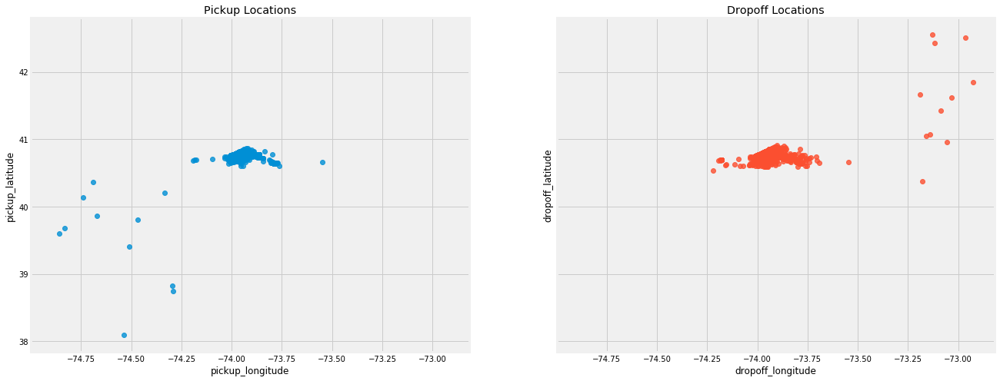

In [16]:
# Print Locations

fig, axes = plt.subplots(1, 2, figsize = (20, 8), sharex=True, sharey=True)
axes = axes.flatten()

# Plot Longitude (x) and Latitude (y)
sns.regplot('pickup_longitude', 'pickup_latitude', fit_reg = False, 
            data = data_manipulated.sample(10000, random_state = RSEED), ax = axes[0]);
sns.regplot('dropoff_longitude', 'dropoff_latitude', fit_reg = False, 
            data = data_manipulated.sample(10000, random_state = RSEED), ax = axes[1]);
axes[0].set_title('Pickup Locations')
axes[1].set_title('Dropoff Locations');

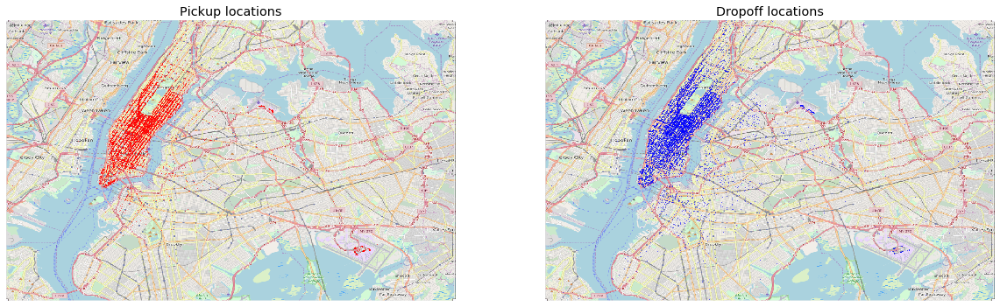

In [17]:
BB_zoom = (-74.1, -73.7, 40.6, 40.85)
nyc_map_zoom = plt.imread('https://github.com/WillKoehrsen/Machine-Learning-Projects/blob/master/images/nyc_-74.1_-73.7_40.6_40.85.PNG?raw=true')

# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, s=10, alpha=0.2, color = False):
    fig, axs = plt.subplots(1, 2, figsize=(18, 22))
    axs[0].scatter(df.pickup_longitude, df.pickup_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations')
    axs[0].axis('off')
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(df.dropoff_longitude, df.dropoff_latitude, zorder=1, alpha=alpha, c='b', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations')
    axs[1].axis('off')
    axs[1].imshow(nyc_map, zorder=0, extent=BB)
    
# plot training data on map zoomed in
plot_on_map(data_manipulated.sample(9_000, random_state = RSEED), 
            BB_zoom, nyc_map_zoom, s=0.2, alpha=0.75)

In [18]:
# SAVE DATASET

data_manipulated.to_csv('03_Distance/distance_outlier_01.csv', index = False)

In [22]:
data_check = pd.read_csv('03_Distance/distance_outlier_01.csv');
data_check.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,abs_lat_diff,abs_lon_diff,manhattan,euclidean,haversine
count,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000,98944.000000
mean,12.898841,-73.974704,40.749244,-73.972699,40.752115,1.526672,0.023421,0.025201,0.048623,0.037506,3.663538
std,10.835837,0.041272,0.061300,0.045388,0.042402,1.075492,0.076933,0.058425,0.127703,0.095441,9.785731
min,2.500000,-74.899808,37.912229,-74.291611,40.124905,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,-73.992081,40.736667,-73.991365,40.735725,1.000000,0.006878,0.006195,0.016212,0.012688,1.243390
50%,9.500000,-73.981934,40.753714,-73.979996,40.754356,1.000000,0.013783,0.012688,0.027752,0.021537,2.122738
75%,14.500000,-73.967621,40.768211,-73.963264,40.769398,2.000000,0.026787,0.024292,0.050733,0.038726,3.915190
max,100.000000,-73.532593,40.970356,-72.902353,42.592319,5.000000,4.423534,1.922139,5.934407,4.674440,508.851457
